# **Product Recognition of Food Products**

## Project for Image Processing and Computer Vision @ Università di Bologna - Assignment

Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>


#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify.
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios. The images contained in this folder are corrupted by noise.

#### Track A - Single Instance Detection
* **Models**: {ref1.png to ref14.png}.
* **Scenes**: {scene1.png to scene5.png}.

#### Track B - Multiple Instances Detection
* **Models**: {ref15.png to ref27.png}.
* **Scenes**: {scene6.png to scene12.png}.

# Initialization

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./
!unzip dataset.zip

Mounted at /content/drive
Archive:  dataset.zip
   creating: dataset/
  inflating: __MACOSX/._dataset      
   creating: dataset/scenes/
  inflating: __MACOSX/dataset/._scenes  
  inflating: dataset/.DS_Store       
  inflating: __MACOSX/dataset/._.DS_Store  
   creating: dataset/models/
  inflating: __MACOSX/dataset/._models  
  inflating: dataset/scenes/scene12.png  
  inflating: __MACOSX/dataset/scenes/._scene12.png  
  inflating: dataset/scenes/scene10.png  
  inflating: __MACOSX/dataset/scenes/._scene10.png  
  inflating: dataset/scenes/scene11.png  
  inflating: __MACOSX/dataset/scenes/._scene11.png  
  inflating: dataset/scenes/scene5.png  
  inflating: __MACOSX/dataset/scenes/._scene5.png  
  inflating: dataset/scenes/scene4.png  
  inflating: __MACOSX/dataset/scenes/._scene4.png  
  inflating: dataset/scenes/scene6.png  
  inflating: __MACOSX/dataset/scenes/._scene6.png  
  inflating: dataset/scenes/scene7.png  
  inflating: __MACOSX/dataset/scenes/._scene7.png  
  inflating: 

#Task A - Single Instance Detection

In [ ]:
import cv2
import numpy as np
import time
import scipy.ndimage
from scipy.stats import norm
import cv2
import os
import skimage.morphology as sk
import matplotlib.pyplot as plt
import matplotlib.patches as patches


In [ ]:
PATH_MODELS = "dataset/models/"
PATH_SCENES = "dataset/scenes/"

Download all the models and scenes from the directory on Google Drive

In [ ]:
#Download all the models and scenes
NUM_MODELS = 27 #Number of all the models
NUM_SCENES = 12 #Number of all scenes
INDEX_MODELS = 14 #Index that helps to split the models of task A and task B
INDEX_SCENES = 5 #Index that helps to split the scenes of task A and task B

models_dict_A = {}
models_dict_B = {}

scenes_dict_A = {}
scenes_dict_B = {}

for i in range(1,INDEX_MODELS + 1):
  image = cv2.imread(PATH_MODELS + "ref" + str(i) + ".png")
  image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  models_dict_A.update({"ref" + str(i) + ".png":image_rgb})

for i in range(INDEX_MODELS + 1,NUM_MODELS+1):
  image = cv2.imread(PATH_MODELS + "ref" + str(i) + ".png")
  image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  models_dict_B.update({"ref" + str(i) + ".png":image_rgb})

for i in range(1,INDEX_SCENES + 1):
  image = cv2.imread(PATH_SCENES + "scene" + str(i) + ".png")
  image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  scenes_dict_A.update({"scene" + str(i) + ".png":image_rgb})

for i in range(INDEX_SCENES + 1,NUM_SCENES+1):
  image = cv2.imread(PATH_SCENES + "scene" + str(i) + ".png")
  image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  scenes_dict_B.update({"scene" + str(i) + ".png":image_rgb})

**ImagePlot** is a class that represents all the images that has to be shown

In [ ]:
class ImagePlot:
  def __init__(self, title_image, image):
    self.title_image = title_image
    self.image = image
  def getTitle(self):
    return self.title_image
  def getImage(self):
    return self.image

**DiagramPlot** is a class that represents a general diagram with one or more lines(in general one for every channel).

In [ ]:
class DiagramPlot:
  def __init__(self, title_diagram, label_x, label_y):
    self.title_diagram = title_diagram
    self.label_x = label_x
    self.label_y = label_y
    self.diagram_list = []
  def setDiagram(self, x, y, label_legend, alpha, color, line):
    self.diagram_list.append([x, y, label_legend, color, alpha, line])
  def getPropDiagram(self):
    return self.title_diagram, self.label_x, self.label_y
  def getDiagram(self):
    return self.diagram_list

**HistRGBPlot** is a class that represent an histogram for every channel of an image. There is also the possibility to plot the approximation of the histogram with a gaussian distribution.

In [ ]:
class HistRGBPlot:
  def __init__(self,title_hist):
    self.title_hist = title_hist
    self.split_hist = False
    self.gauss_hist = False
  def setRedChannelHist(self,hist_r,title_r, alpha_r, color_r, y_lim_r, label_x_r, label_y_r,label_legend_r):
    self.hist_r = hist_r
    self.title_r = title_r
    self.alpha_r = alpha_r
    self.color_r = color_r
    self.y_lim_r = y_lim_r
    self.label_x_r = label_x_r
    self.label_y_r = label_y_r
    self.label_legend_r = label_legend_r

  def setGreenChannelHist(self,hist_g,title_g, alpha_g, color_g, y_lim_g, label_x_g, label_y_g,label_legend_g):
    self.hist_g = hist_g
    self.title_g = title_g
    self.alpha_g = alpha_g
    self.color_g = color_g
    self.y_lim_g = y_lim_g
    self.label_x_g = label_x_g
    self.label_y_g = label_y_g
    self.label_legend_g = label_legend_g

  def setBlueChannelHist(self,hist_b,title_b, alpha_b, color_b, y_lim_b, label_x_b, label_y_b,label_legend_b):
    self.hist_b = hist_b
    self.title_b = title_b
    self.alpha_b = alpha_b
    self.color_b = color_b
    self.y_lim_b = y_lim_b
    self.label_x_b = label_x_b
    self.label_y_b = label_y_b
    self.label_legend_b = label_legend_b
  def setRedChannelGauss(self, x_r, y_r, gauss_linestyle_r, gauss_alpha_r, gauss_color_r, gauss_label_legend_r):
    self.x_r = x_r
    self.y_r = y_r
    self.gauss_linestyle_r = gauss_linestyle_r
    self.gauss_alpha_r = gauss_alpha_r
    self.gauss_color_r = gauss_color_r
    self.gauss_label_legend_r = gauss_label_legend_r
  def setGreenChannelGauss(self, x_g, y_g, gauss_linestyle_g, gauss_alpha_g, gauss_color_g, gauss_label_legend_g):
    self.x_g = x_g
    self.y_g = y_g
    self.gauss_linestyle_g = gauss_linestyle_g
    self.gauss_alpha_g = gauss_alpha_g
    self.gauss_color_g = gauss_color_g
    self.gauss_label_legend_g = gauss_label_legend_g
  def setBlueChannelGauss(self, x_b, y_b, gauss_linestyle_b, gauss_alpha_b, gauss_color_b, gauss_label_legend_b):
    self.x_b = x_b
    self.y_b = y_b
    self.gauss_linestyle_b = gauss_linestyle_b
    self.gauss_alpha_b = gauss_alpha_b
    self.gauss_color_b = gauss_color_b
    self.gauss_label_legend_b = gauss_label_legend_b

  def setSplitHist(self, split_hist):
    self.split_hist = split_hist
  def setGaussHist(self, gauss_hist):
    self.gauss_hist = gauss_hist
  def isSplitHist(self):
    return self.split_hist
  def isGaussHist(self):
    return self.gauss_hist

  def getRedChannelGauss(self):
    return self.x_r, self.y_r, self.gauss_linestyle_r, self.gauss_alpha_r, self.gauss_color_r, self.gauss_label_legend_r
  def getGreenChannelGauss(self):
    return self.x_g, self.y_g, self.gauss_linestyle_g, self.gauss_alpha_g, self.gauss_color_g, self.gauss_label_legend_g
  def getBlueChannelGauss(self):
    return self.x_b, self.y_b, self.gauss_linestyle_b, self.gauss_alpha_b, self.gauss_color_b, self.gauss_label_legend_b

  def getRedChannelHist(self):
    return self.hist_r, self.title_r, self.alpha_r, self.color_r, self.y_lim_r, self.label_x_r, self.label_y_r, self.label_legend_r
  def getGreenChannelHist(self):
    return self.hist_g, self.title_g, self.alpha_g, self.color_g, self.y_lim_g, self.label_x_g, self.label_y_g, self.label_legend_g
  def getBlueChannelHist(self):
    return self.hist_b, self.title_b, self.alpha_b, self.color_b, self.y_lim_b, self.label_x_b, self.label_y_b, self.label_legend_b
  def getTitleHist(self):
    return self.title_hist

**getMaxValueHist** is used to get the peak of the histogram. It is useful when we have to show the maximum value of the salt-and-pepper noise.

In [ ]:
def getMaxValueHist(hist):
  hist_list = hist.flatten()
  hist_list.sort()
  return hist_list[-1]

**getValueHist** is used to get one specific value from the histogram. It is useful when we have to show the peak value of the salt-and-pepper noise.

In [ ]:
def getValueHist(hist, pixel):
  hist_list = hist.flatten()
  return hist_list[pixel]

**calcGauss** computes the approximation of an histogram image with a gaussian distribution

In [ ]:
def calcGauss(image, x_range):
  mean, stddev = cv2.meanStdDev(image)
  mean = mean[0][0]
  stddev = stddev[0][0]
  xmin, xmax = x_range
  x = np.linspace(xmin, xmax, 100)
  y = norm.pdf(x, mean, stddev)
  return x,y,mean,stddev

**plot_data** plot all the diagram and images that are listed into *img_plot* (it can contain object of class HistRGBPlot, DiagramPlot or ImagePlot). This function simplifies all the code when we have to show diagram/images.

In [ ]:
def plot_data(dim_plot, dim, title_plot, title_style, subtitle_style,img_plot):
  suptitle_fontsize, suptitle_color = title_style
  title_size, title_color = subtitle_style

  rows,cols = dim
  dim_x, dim_y = dim_plot
  i = 1
  plt.figure(figsize=(dim_x,dim_y))
  plt.suptitle(title_plot, fontsize = suptitle_fontsize, color = suptitle_color)
  if isinstance(img_plot,dict):
    img_plot = [ImagePlot(label,img) for label, img in img_plot.items()]
  for obj in img_plot:
    if isinstance(obj,DiagramPlot):
      title_data, label_x, label_y = obj.getPropDiagram()
      diagram_list = obj.getDiagram()


      plt.subplot(rows,cols,i)
      for x, y, label_legend, color, alpha, line in diagram_list:
        plt.plot(x, y, label = label_legend, color = color, alpha = alpha, linestyle = line)

      plt.xlabel(label_x)
      plt.ylabel(label_y)
      plt.legend()
      plt.title(title_data, fontsize = title_size, color = title_color)
      i = i + 1
    if isinstance(obj,ImagePlot):
      title_data = obj.getTitle()
      img_data = obj.getImage()
      plt.subplot(rows,cols,i)
      plt.imshow(img_data)
      plt.title(title_data, fontsize = title_size, color = title_color)
      i = i + 1

    if isinstance(obj,HistRGBPlot):
      title_hist = obj.getTitleHist()
      hist_r, title_r, alpha_r, color_r, y_lim_r, label_x_r, label_y_r, label_legend_r = obj.getRedChannelHist()
      hist_g, title_g, alpha_g, color_g, y_lim_g, label_x_g, label_y_g, label_legend_g = obj.getGreenChannelHist()
      hist_b, title_b, alpha_b, color_b, y_lim_b, label_x_b, label_y_b, label_legend_b = obj.getBlueChannelHist()
      if bool(obj.isSplitHist()) == False:
        plt.subplot(rows,cols,i)
        if bool(obj.isGaussHist()) == True:
          x_r, y_r, gauss_linestyle_r, gauss_alpha_r, gauss_color_r, gauss_label_legend_r = obj.getRedChannelGauss()
          x_g, y_g, gauss_linestyle_g, gauss_alpha_g, gauss_color_g, gauss_label_legend_g = obj.getGreenChannelGauss()
          x_b, y_b, gauss_linestyle_b, gauss_alpha_b, gauss_color_b, gauss_label_legend_b = obj.getBlueChannelGauss()

          hist_r /= hist_r.sum()
          hist_g /= hist_g.sum()
          hist_b /= hist_b.sum()

          plt.plot(x_r,y_r,linestyle = gauss_linestyle_r ,label = gauss_label_legend_r, color = gauss_color_r, alpha = gauss_alpha_r)
          plt.plot(x_g,y_g,linestyle = gauss_linestyle_g ,label = gauss_label_legend_g, color = gauss_color_g, alpha = gauss_alpha_g)
          plt.plot(x_b,y_b,linestyle = gauss_linestyle_b ,label = gauss_label_legend_b, color = gauss_color_b, alpha = gauss_alpha_b)



        plt.plot(hist_r, label = label_legend_r, color = color_r, alpha = alpha_r)
        plt.plot(hist_g, label = label_legend_g, color = color_g, alpha = alpha_g)
        plt.plot(hist_b, label = label_legend_b, color = color_b, alpha = alpha_b)
        plt.title(title_hist, fontsize = title_size, color = title_color)
        plt.xlabel(label_x_r)
        plt.ylabel(label_y_r)
        plt.legend()
        i = i + 1
      else:
        plt.subplot(rows,cols,i)
        plt.plot(hist_r, label = label_legend_r, color = color_r, alpha = alpha_r)
        plt.ylim(0, y_lim_r)
        plt.title(title_r, fontsize = title_size, color = title_color)
        plt.xlabel(label_x_r)
        plt.ylabel(label_y_r)
        plt.legend()
        i = i + 1

        plt.subplot(rows,cols,i)
        plt.plot(hist_g, label = label_legend_g, color = color_g, alpha = alpha_g)
        plt.ylim(0, y_lim_g)
        plt.title(title_g, fontsize = title_size, color = title_color)
        plt.xlabel(label_x_g)
        plt.ylabel(label_y_g)
        plt.legend()
        i = i + 1

        plt.subplot(rows,cols,i)
        plt.plot(hist_b, label = label_legend_b, color = color_b, alpha = alpha_b)
        plt.ylim(0, y_lim_b)
        plt.title(title_b, fontsize = title_size, color = title_color)
        plt.xlabel(label_x_b)
        plt.ylabel(label_y_b)
        plt.legend()
        i = i + 1

  plt.show()


Show all the scenes and models of the project

In [ ]:
main_title = "MODELS A"
style_main_title = (20,"red")
style_plot_title = (15,"black")
plot_data((15,25),(6,5), main_title, style_main_title, style_plot_title, models_dict_A)

https://github.com/LorenzoSansone/ImageComputerVision/blob/103c5398540f2b659229662ca4ef56734d6fc21a/models1.png

In [ ]:
main_title = "MODELS B"
style_main_title = (20,"red")
style_plot_title = (15,"black")
plot_data((15,25),(6,5), main_title, style_main_title, style_plot_title, models_dict_B)

https://github.com/LorenzoSansone/ImageComputerVision/blob/f706f89cfdbac6174088cd806488b97402eba7a4/modelsB.png

In [ ]:
main_title = "SCENES A"
style_main_title = (20,"red")
style_plot_title = (15,"black")
plot_data((15,30),(7,2), main_title, style_main_title, style_plot_title, scenes_dict_A)

https://github.com/LorenzoSansone/ImageComputerVision/blob/099f93f80c97b23f89e5642fc68518efb6283a06/sceneA.png

In [ ]:
main_title = "SCENES B"
style_main_title = (20,"red")
style_plot_title = (15,"black")
plot_data((15,30),(7,2), main_title, style_main_title, style_plot_title, scenes_dict_B)

https://github.com/LorenzoSansone/ImageComputerVision/blob/8abd2d008320b0185f1f46cf61e3f9071ffc0cdc/scenesB.png

##Denoising

For the denoising we have only considered the scenes of the task A in order to maximise the result of the task A. The images are clearly corrupted by noise. We have started to explore the scenes using the histogram because we can extract useful information from it.

We have splitted the histograms in order to show better every distribution of each channel (using the **same scale** for each diagram)

In [ ]:
####PARAMETES HISTOGRAM
alpha_r = alpha_g = alpha_b = 0.7
color_r, color_g, color_b = "red", "green", "blue"
y_lim_r = y_lim_g = y_lim_b = 700000
label_legend_r = "Pixels channel R"
label_legend_g = "Pixels channel G"
label_legend_b = "Pixels channel B"
label_x_r = label_x_g = label_x_b = "Pixels"
label_y_r = label_y_g = label_y_b = "Frequency"
num_bins = 256
pixel_range = [0, 256]

####PARAMETERS PLOT
rows = len(scenes_dict_A)
cols = 4
main_title = "Histogram for every channel of the scenes' task A"
style_main_title = (30,"red")
style_plot_title = (15,"black")

image_plot_list = []

for label,img in scenes_dict_A.items():

  #Compute the histogram for every scene
  title_r = "Histogram channel R of " + label
  hist_r = cv2.calcHist([img],[0],None,[num_bins],pixel_range)

  title_g = "Histogram channel G of " + label
  hist_g = cv2.calcHist([img],[1],None,[num_bins],pixel_range)

  title_b = "Histogram channel B of " + label
  hist_b = cv2.calcHist([img],[2],None,[num_bins],pixel_range)

  title_hist = "Histogram of " + label

  #Plot the image
  image_plot_list.append(ImagePlot(label,img))

  #Plot the histogram
  hist_plot = HistRGBPlot(title_hist)
  hist_plot.setRedChannelHist(hist_r,title_r,alpha_r,color_r,y_lim_r,label_x_r, label_y_r, label_legend_r)
  hist_plot.setGreenChannelHist(hist_g,title_g,alpha_g,color_g,y_lim_g,label_x_g, label_y_g, label_legend_g)
  hist_plot.setBlueChannelHist(hist_b,title_b,alpha_b,color_b,y_lim_b,label_x_b, label_y_b, label_legend_b)
  hist_plot.setSplitHist(True)
  image_plot_list.append(hist_plot)

#Show
plot_data((30,30),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/efdd7231fe4b238a227fab334d6eb39ec398c78f/Den1.png

###Median filter

There are 2 **large peaks** in each histogram. One of them is made up of a group of 0 pixels and the other one is made up of a group of 225 pixels. The amount of pixels in the 2 groups is high enough to obscure the distribution of the other pixels. All this facts can be an evidence that there is **impulse noise** (aka Salt-and-Pepper noise). One of the filter most effective for this type of noise is "Median filter".

The **Median filter** is a non-linear filter that is useful against the salt-and-pepper noise (impulse
noise) without introducing significant blur. This filter replaces each pixel intensity with the median
over a neighbourhood.

Firstly, the median filter is applied over a single image in order to visualize better the result over the histogram and the scene.

In [ ]:
####PARAMETES HISTOGRAM
alpha_r = alpha_g = alpha_b = 0.7
color_r, color_g, color_b = "red", "green", "blue"
y_lim_r = y_lim_g = y_lim_b = 700000
label_legend_r = "Pixels channel R"
label_legend_g = "Pixels channel G"
label_legend_b = "Pixels channel B"
label_x_r = label_x_g = label_x_b = "Pixels"
label_y_r = label_y_g = label_y_b = "Frequency"
num_bins = 256
pixel_range = [0, 256]

####PARAMETERS MEDIAN FILTER
k_sizes = [3,5,7,9,11]

####PARAMETERS PLOT
rows = len(k_sizes)
cols = 3
style_main_title = (30,"red")
style_plot_title = (15,"black")

image_plot_list = []
label, img = list(scenes_dict_A.items())[0] #Choose the first scene
main_title = "Histogram of denoised " + label + " with Median filter for k=" + str(k_sizes)

for k_size in k_sizes:

  #Apply the median filter over the image
  title_median_img = label + " denoised with k=" + str(k_size)
  median_img = cv2.medianBlur(img, k_size)

  #Compute the histogram of all the channel
  title_r = "Histogram channel R of " + label + " denoised"
  hist_r = cv2.calcHist([median_img],[0],None,[num_bins],pixel_range)

  title_g = "Histogram channel G of " + label + " denoised"
  hist_g = cv2.calcHist([median_img],[1],None,[num_bins],pixel_range)

  title_b = "Histogram channel B of " + label + " denoised"
  hist_b = cv2.calcHist([median_img],[2],None,[num_bins],pixel_range)

  title_hist = "Histogram of " + label + " denoised with k=" + str(k_size)

  #Compose the list with all the images and histograms to plot
  image_plot_list.append(ImagePlot(label,img))
  image_plot_list.append(ImagePlot(title_median_img,median_img))

  hist_plot = HistRGBPlot(title_hist)
  hist_plot.setRedChannelHist(hist_r,title_r,alpha_r,color_r,y_lim_r,label_x_r, label_y_r, label_legend_r)
  hist_plot.setGreenChannelHist(hist_g,title_g,alpha_g,color_g,y_lim_g,label_x_g, label_y_g, label_legend_g)
  hist_plot.setBlueChannelHist(hist_b,title_b,alpha_b,color_b,y_lim_b,label_x_b, label_y_b, label_legend_b)
  image_plot_list.append(hist_plot)

#Show
plot_data((40,6*rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)


https://github.com/LorenzoSansone/ImageComputerVision/blob/eac3d7307298c9a0cb2a3a0abd63d814737763f2/Median1.png

From the previous plot, we can observe that the *peaks on the histogram decrease* applying larger value of k but the images start to loose some details. Moreover the value of the peaks don't decrease as much as we expected. To sum up, we can't delete totally the salt-and-pepper noise from all the images because we want to keep the details of the scenes as much as possible. The procedure is to find the right **compromise** between the amount of noise and the details of the scenes.

This analysis can be applied for all the scenes of the task A for every k: all images get better as soon as we apply a bigger k but with higher values all the images start to loose details.

Graphically, it seems that the right kernel is k=5 or k=7 because k=9 or k=11 start to blur the image. With k=5 or k=7 salt-and-pepper noise is reduced and the majority of the details aren't compromised

We cut out some regions of the scenes in order to get another point of view of the effects' filters.
The **homogeneous region** has some interesting properties:
* **Reduce the complexity**: homogeneous regions have uniform characteristic like the color, texture, ecc...
* **Isolated impact**: we can better isolate and understand the specific impact of the filter on that region without the interference of other elements.
* **Improved quantitative analysis**: quantitative metrics are easier to compute and more meaningful in homogeneous regions.


We have created two list:
* **scenes_zoom_dict_A**: it contains all the zoomed images that we have cut out from the scenes. There are 4 homogeneous region for every scene.
* **sample_scenes_zoom_dict_A**: it contains only one zoomed image for every scene. This dictionary is useful for simple analysis.

In [ ]:
prefix = "zoom_"
label1,img1 = list(scenes_dict_A.items())[0] #scene1
label2,img2 = list(scenes_dict_A.items())[1] #scene2
label3,img3 = list(scenes_dict_A.items())[2] #scene3
label4,img4 = list(scenes_dict_A.items())[3] #scene4
label5,img5 = list(scenes_dict_A.items())[4] #scene5

#Homogeneous image from the scene1.png
img_zoom1 = img1[200:300,850:950]
img_zoom2 = img1[300:400,10:110]
img_zoom3 = img1[400:500,700:800]
img_zoom4 = img1[200:300,1530:1630]

#Homogeneous image from the scene2.png
img_zoom5 = img2[800:900,50:150]
img_zoom6 = img2[400:500,20:120]
img_zoom7 = img2[250:350,900:1000]
img_zoom8 = img2[790:890,1500:1600]

#Homogeneous image from the scene3.png
img_zoom9 = img3[200:300,50:150]
img_zoom10 = img3[450:550,700:800]
img_zoom11 = img3[400:500,1200:1300]
img_zoom12 = img3[500:600,50:150]

#Homogeneous image from the scene4.png
img_zoom13 = img4[1090:1190,450:550]
img_zoom14 = img4[400:500,810:910]
img_zoom15 = img4[600:700,500:600]
img_zoom16 = img4[250:350,200:300]

#Homogeneous image from the scene5.png
img_zoom17 = img5[700:800,600:730]
img_zoom18 = img5[0:100,700:800]
img_zoom19 = img5[10:110,10:100]
img_zoom20 = img5[10:110,900:1000]

#dictionary with all samples
scenes_zoom_dict_A = {prefix + label1+"_1":img_zoom1,  prefix + label1+"_2":img_zoom2,  prefix + label1+"_3":img_zoom3,  prefix + label1 + "_4":img_zoom4,
                      prefix + label2+"_1":img_zoom5,  prefix + label2+"_2":img_zoom6,  prefix + label2+"_3":img_zoom7,  prefix + label2 + "_4":img_zoom8,
                      prefix + label3+"_1":img_zoom9,  prefix + label3+"_2":img_zoom10, prefix + label3+"_3":img_zoom11, prefix + label3 + "_4":img_zoom12,
                      prefix + label4+"_1":img_zoom13, prefix + label4+"_2":img_zoom14, prefix + label4+"_3":img_zoom15, prefix + label4 + "_4":img_zoom16,
                      prefix + label5+"_1":img_zoom17, prefix + label5+"_2":img_zoom18, prefix + label5+"_3":img_zoom19, prefix + label5 + "_4":img_zoom20}

#dictionary with one homogeneous image for every scene
sample_scenes_zoom_dict_A ={prefix + label1:img_zoom1, prefix + label2:img_zoom2, prefix + label3:img_zoom3, prefix + label4:img_zoom4,prefix + label5:img_zoom5 }


We apply the same analysis that we have done before to the zoomed images. We want to show the behaviour of the noise in a different scale. The noise is also visible at this scale (obviously with different values)

Apply median filter with several k (the promising ones) to all the "zoom image"

In [ ]:
####PARAMETES HISTOGRAM
alpha_r = alpha_g = alpha_b = 0.7
color_r, color_g, color_b = "red", "green", "blue"
y_lim_r = y_lim_g = y_lim_b = 6000
label_legend_r = "Pixels channel R"
label_legend_g = "Pixels channel G"
label_legend_b = "Pixels channel B"
label_x_r = label_x_g = label_x_b = "Pixels"
label_y_r = label_y_g = label_y_b = "Frequency"
num_bins = 256
pixel_range = [0, 256]

####PARAMETERS FILTER
k_sizes = [3,5,7]

####PARAMETERS PLOT
rows = len(sample_scenes_zoom_dict_A)
cols = 6
main_title = "Histograms for homogeneous image with Median filter for k=" + str(k_sizes)
style_main_title = (30,"red")
style_plot_title = (15,"black")


image_plot_list = []


for label,img in sample_scenes_zoom_dict_A.items():
  for k_size in k_sizes:

    #Apply the median filter
    title_median_img = label + " denoised with k=" + str(k_size)
    median_img = cv2.medianBlur(img, k_size)

    #Compute the histogram for every channel
    title_r = "Histogram channel R of denoised " + label + " with k=" + str(k_size)
    hist_r = cv2.calcHist([median_img], [0], None, [num_bins], pixel_range)

    title_g = "Histogram channel G of denoised " + label + " with k=" + str(k_size)
    hist_g = cv2.calcHist([median_img], [1], None, [num_bins], pixel_range)

    title_b = "Histogram channel B of denoised " + label + " with k=" + str(k_size)
    hist_b = cv2.calcHist([median_img], [2], None, [num_bins], pixel_range)

    title_hist = "Histogram of denoised " + label + " with k=" + str(k_size)


    #Append all the images and histogram to image_plt_list
    image_plot_list.append(ImagePlot(title_median_img,median_img))

    hist_plot = HistRGBPlot(title_hist)
    hist_plot.setRedChannelHist(hist_r,title_r,alpha_r,color_r,y_lim_r,label_x_r, label_y_r, label_legend_r)
    hist_plot.setGreenChannelHist(hist_g,title_g,alpha_g,color_g,y_lim_g,label_x_g, label_y_g, label_legend_g)
    hist_plot.setBlueChannelHist(hist_b,title_b,alpha_b,color_b,y_lim_b,label_x_b, label_y_b, label_legend_b)
    image_plot_list.append(hist_plot)

#Show
plot_data((40,6*rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/3623c853b223244c52c74678a0941a02485f17b0/Median2.png

In some examples, we can observe better the result of median filter **over the homogeneous images** than the result of the filter on the overall scene. For example, on zoom_scene5.png the noise seems to be almost deleted. The other scenes get better but the noise is still strongly present. These results show better the process of denoising.

We have easily obeserved that the 2 large peaks are in corresponding of the **pixel 0** and the **pixel 225**.

In order to understand better the effect of Median filter we can try to calculate the histogram of every scene, get the value of the peaks (that correspond to the salt-and-pepper's peaks) and show how much the noise (so the peaks) is reduced when we increase the k of filter.

In [ ]:
####PARAMETES DIAGRAM
alpha_r = alpha_g = alpha_b = 0.7
color_r, color_g, color_b = "red", "green", "blue"
line_r1, line_g1, line_b1 = "--","--","--"
line_r2, line_g2, line_b2 = "-","-","-"
label_legend_r1 = "0 pixel's peak channel R"
label_legend_g1 = "0 pixel's peak channel G"
label_legend_b1 = "0 pixel's peak channel B"

label_legend_r2 = "225 pixel's peak channel R"
label_legend_g2 = "225 pixel's peak channel G"
label_legend_b2 = "225 pixel's peak channel B"

label_x = "k_size"
label_y = "Pixels"

####PARAMETERS HISTOGRAM
num_bins = 256
pixel_range = [0, 256]

####PARAMETERES FILTER
k_sizes = [1,3,5,7,9,11,13]

#PARAMETER PLOT
rows = len(scenes_dict_A)
cols = 3
main_title = "Diagrams of scenes about the trend of the peaks of salt-and-pepper noises respect to k=" + str(k_sizes)
style_main_title = (30,"red")
style_plot_title = (15,"black")

#The value of pixels where there are the peaks of the salt-and-pepper noise
pixel1 = 0
pixel2 = 225
image_plot_list = []

for label,img in scenes_dict_A.items():

  #Histogram values of the pixel 0
  hist_r_list1 = []
  hist_g_list1 = []
  hist_b_list1 = []

  #Histogram values of the pixel 255
  hist_r_list2 = []
  hist_g_list2 = []
  hist_b_list2 = []

  for k_size in k_sizes:

    #Compute denoising
    median_img = cv2.medianBlur(img, k_size)

    #Compute the histogram
    hist_r = cv2.calcHist([median_img], [0], None, [num_bins], pixel_range)
    hist_g = cv2.calcHist([median_img], [1], None, [num_bins], pixel_range)
    hist_b = cv2.calcHist([median_img], [2], None, [num_bins], pixel_range)

    #Get the peak of the pixel 0
    hist_r_list1.append(getValueHist(hist_r, pixel1))
    hist_g_list1.append(getValueHist(hist_g, pixel1))
    hist_b_list1.append(getValueHist(hist_b, pixel1))

    #Get the peak of the pixel 225
    hist_r_list2.append(getValueHist(hist_r, pixel2))
    hist_g_list2.append(getValueHist(hist_g, pixel2))
    hist_b_list2.append(getValueHist(hist_b, pixel2))

  title_diagram = "Diagram of " + label
  diag_img = DiagramPlot(title_diagram, label_x, label_y)

  #Plot the diagram of the trend of the pixels 0 and 225
  diag_img.setDiagram(k_sizes, hist_r_list1, label_legend_r1, alpha_r, color_r, line_r1)
  diag_img.setDiagram(k_sizes, hist_g_list1, label_legend_g1, alpha_g, color_g, line_g1)
  diag_img.setDiagram(k_sizes, hist_b_list1, label_legend_b1, alpha_b, color_b, line_b1)

  diag_img.setDiagram(k_sizes, hist_r_list2, label_legend_r2, alpha_r, color_r, line_r2)
  diag_img.setDiagram(k_sizes, hist_g_list2, label_legend_g2, alpha_g, color_g, line_g2)
  diag_img.setDiagram(k_sizes, hist_b_list2, label_legend_b2, alpha_b, color_b, line_b2)
  image_plot_list.append(diag_img)

#Show
plot_data((40,6*rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)


https://github.com/LorenzoSansone/ImageComputerVision/blob/93cb85bc4b8b8aca3cbcfce921d9c09a9dc8c7ad/Median3.png

We apply the same procedure to homogeneous image

In [ ]:
####PARAMETES DIAGRAM
alpha_r = alpha_g = alpha_b = 0.7
color_r, color_g, color_b = "red", "green", "blue"
line_r1, line_g1, line_b1 = "--","--","--"
line_r2, line_g2, line_b2 = "-","-","-"
label_legend_r1 = "0 pixel's peak channel R"
label_legend_g1 = "0 pixel's peak channel G"
label_legend_b1 = "0 pixel's peak channel B"

label_legend_r2 = "225 pixel's peak channel R"
label_legend_g2 = "225 pixel's peak channel G"
label_legend_b2 = "225 pixel's peak channel B"

label_x = "k_size"
label_y = "Pixels"

####PARAMETERS HISTOGRAM
num_bins = 256
pixel_range = [0, 256]

###PARAMETER FILTER
k_sizes = [1,3,5,7,9,11,13]

####PARAMETER PLOT
rows = len(scenes_dict_A)
cols = 3
main_title = "Diagrams of homogeneous images about the trend of the peaks of salt-and-pepper noises respect to k=" + str(k_sizes)
style_main_title = (30,"red")
style_plot_title = (15,"black")

#The value of pixels where there are the peaks of the salt-and-pepper noise
pixel1 = 0
pixel2 = 225

image_plot_list = []

for label,img in sample_scenes_zoom_dict_A.items():
  hist_r_list1 = []
  hist_g_list1 = []
  hist_b_list1 = []

  hist_r_list2 = []
  hist_g_list2 = []
  hist_b_list2 = []

  for k_size in k_sizes:
    median_img = cv2.medianBlur(img, k_size)
    hist_r = cv2.calcHist([median_img], [0], None, [num_bins], pixel_range)
    hist_g = cv2.calcHist([median_img], [1], None, [num_bins], pixel_range)
    hist_b = cv2.calcHist([median_img], [2], None, [num_bins], pixel_range)

    hist_r_list1.append(getValueHist(hist_r, pixel1))
    hist_g_list1.append(getValueHist(hist_g, pixel1))
    hist_b_list1.append(getValueHist(hist_b, pixel1))

    hist_r_list2.append(getValueHist(hist_r, pixel2))
    hist_g_list2.append(getValueHist(hist_g, pixel2))
    hist_b_list2.append(getValueHist(hist_b, pixel2))

  title_diagram = "Diagram of " + label
  diag_img = DiagramPlot(title_diagram, label_x, label_y)
  diag_img.setDiagram(k_sizes, hist_r_list1, label_legend_r1, alpha_r, color_r, line_r1)
  diag_img.setDiagram(k_sizes, hist_g_list1, label_legend_g1, alpha_g, color_g, line_g1)
  diag_img.setDiagram(k_sizes, hist_b_list1, label_legend_b1, alpha_b, color_b, line_b1)

  diag_img.setDiagram(k_sizes, hist_r_list2, label_legend_r2, alpha_r, color_r, line_r2)
  diag_img.setDiagram(k_sizes, hist_g_list2, label_legend_g2, alpha_g, color_g, line_g2)
  diag_img.setDiagram(k_sizes, hist_b_list2, label_legend_b2, alpha_b, color_b, line_b2)

  image_plot_list.append(diag_img)

plot_data((40,6*rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)


https://github.com/LorenzoSansone/ImageComputerVision/blob/ca80289017cfb026cfe21e189ff5305a83a36601/Median4.png

From the plot of the diagram of the scene we can notice that when we apply a k greater than 7 the peaks of the noise doesn't decrease significantly. Obviously, when we apply a k>=7 the image starts to blur a lot.

The k = 3 and  k = 5 **improve significally** the quality of image. So, it reasonable to start with k = 3 or k = 5 for Median filter in order to reduce the noise and keep the details as much as possible.

The trend is similar on the plot of zoomed image but it is not very marked.

In conclusion, we start using k = 5 for the median filter because it is a **good compromise** between the amount of noise removed from the image and the amount of details that are kept on the image.

If it will not be enough we will increase or decrease k to 3 or 7 but we will surely avoid to use k greater or equal than 9 because the noise isn't reduced significantly anymore and the images start to blur a lot.

Let's build dictionary with filtered image in order to continue the process of denoising. From now, we use mainly the denoised images with median filter.

In [ ]:
k_size = 5
label_filter = " (MedFilt k=" + str(k_size) +  ")"
median_scenes_dict_A = {}
median_scenes_zoom_dict_A = {}
median_sample_scenes_zoom_dict_A = {}

#Denoising for the scenes dictionary
for label, img in scenes_dict_A.items():
  median_img = cv2.medianBlur(img, k_size)
  median_scenes_dict_A.update({label + label_filter:median_img})

#Denoising for the homogeneous scenes dictionary
for label, img in scenes_zoom_dict_A.items():
  median_img = cv2.medianBlur(img, k_size)
  median_scenes_zoom_dict_A.update({label + label_filter:median_img})

#Denoising for the small homogeneous scenes dictionary
for label, img in sample_scenes_zoom_dict_A.items():
  median_img = cv2.medianBlur(img, k_size)
  median_sample_scenes_zoom_dict_A.update({label + label_filter:median_img})

###Gaussian filter

From the previous analysis we can notice a **normal distribution** of the pixels on some histogram (mainly from the homogeneous images). This fact can be a clue that is present guassian noise. We make a deep exploration to confirm the hypothesis.

Firstly, we can explore the histogram in a better way in order to catch the gaussian noise:
* plot the histogram with a restricted range of pixels in order to delete the peaks of the pixels that *black out* the other one.
* plot the gaussian distribution calculated by *statistical analysis*

With the classic scenes it isn't very marked the presence of gaussian noise. We apply the procedure to homogeneous images.

In [ ]:
####PARAMETES HISTOGRAM
alpha_r = alpha_g = alpha_b = 0.4
color_r, color_g, color_b = "red", "green", "blue"
y_lim_r = y_lim_g = y_lim_b = 700000
label_legend_r = "Channel R"
label_legend_g = "Channel G"
label_legend_b = "Channel B"
label_x_r = label_x_g = label_x_b = "Pixels"
label_y_r = label_y_g = label_y_b = "Frequency"
num_bins = 223
pixel_range = [1, 224]

####PARAMETERS GAUSSIAN APPROXIMATION
gauss_color_r, gauss_color_g, gauss_color_b = "red", "green", "blue"
gauss_alpha_r = gauss_alpha_g = gauss_alpha_b = 0.9
x_range_gauss = (0,224)
gauss_label_legend_r = "Gaussian distribution R"
gauss_label_legend_g = "Gaussian distribution G"
gauss_label_legend_b = "Gaussian distribution B"
gauss_linestyle_r = gauss_linestyle_g = gauss_linestyle_b = "--"

####PARAMETERS PLOT
rows = len(median_scenes_zoom_dict_A)*2
cols = 4
main_title = "Show histogram " + str(pixel_range) + " of every zoomed scene with the gaussian distribution approximation"
style_main_title = (30,"red")
style_plot_title = (15,"black")

image_plot_list = []
data_gauss_zoom = []
for label,img in median_scenes_zoom_dict_A.items():
  img_r, img_g, img_b = cv2.split(img)

  #Compute the histogram for each channel
  title_r = "Histogram channel R of " + label
  hist_r = cv2.calcHist([img_r],[0],None,[num_bins],pixel_range)

  title_g = "Histogram channel G of " + label
  hist_g = cv2.calcHist([img_g],[0],None,[num_bins],pixel_range)

  title_b = "Histogram channel B of " + label
  hist_b = cv2.calcHist([img_b],[0],None,[num_bins],pixel_range)

  title_hist = "Histogram of " + label

  image_plot_list.append(ImagePlot(label,img))

  #Plot the histogram
  hist_plot = HistRGBPlot(title_hist)
  hist_plot.setRedChannelHist(hist_r,title_r,alpha_r,color_r,y_lim_r,label_x_r, label_y_r, label_legend_r)
  hist_plot.setGreenChannelHist(hist_g,title_g,alpha_g,color_g,y_lim_g,label_x_g, label_y_g, label_legend_g)
  hist_plot.setBlueChannelHist(hist_b,title_b,alpha_b,color_b,y_lim_b,label_x_b, label_y_b, label_legend_b)

  #Compute the gaussian distribution
  x_r, y_r, mean_r,stddev_r = calcGauss(img_r,x_range_gauss)
  x_g, y_g, mean_g,stddev_g = calcGauss(img_g,x_range_gauss)
  x_b, y_b, mean_b,stddev_b = calcGauss(img_b,x_range_gauss)
  data_gauss_zoom.append([label, mean_r, stddev_r, mean_g, stddev_g, mean_b, stddev_b])

  #Plot the gaussian distribution
  hist_plot.setRedChannelGauss(x_r, y_r, gauss_linestyle_r, gauss_alpha_r, gauss_color_r, gauss_label_legend_r)
  hist_plot.setGreenChannelGauss(x_g, y_g, gauss_linestyle_g, gauss_alpha_g, gauss_color_g, gauss_label_legend_g)
  hist_plot.setBlueChannelGauss(x_b, y_b, gauss_linestyle_b, gauss_alpha_b, gauss_color_b, gauss_label_legend_b)
  hist_plot.setGaussHist(True)
  image_plot_list.append(hist_plot)

#Show
plot_data((40,6 * rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/749d5cde81a0fa12813ee687c64376916c58bed1/Gaussian1.png

By examining the histogram of the images above we can see that the pixel values follow a normal distribution which is indicative of Gaussian noise.

We have computed the standard deviation and the mean of every gaussian distribution for every image in order to have a **quantitative measure**.

The data from homogeneous images are more useful because the noise is more highlighted.

In [ ]:
from prettytable import PrettyTable

table_zoom = PrettyTable(["Name image", "mean red channel", "stddev red channel", "mean green channel", "stddev green channel", "mean blue channel", "stddev blue channel"])

#Compute mean and stddve of homogeneous images
for label_img, mean_r, stddev_r, mean_g, stddev_g, mean_b, stddev_b in data_gauss_zoom:
  table_zoom.add_row([label_img, round(mean_r,1), round(stddev_r,1), round(mean_g,1), round(stddev_g,1), round(mean_b,1), round(stddev_b,1)])


print(table_zoom)


+---------------------------------+------------------+--------------------+--------------------+----------------------+-------------------+---------------------+
|            Name image           | mean red channel | stddev red channel | mean green channel | stddev green channel | mean blue channel | stddev blue channel |
+---------------------------------+------------------+--------------------+--------------------+----------------------+-------------------+---------------------+
| zoom_scene1.png_1 (MedFilt k=5) |      213.7       |        16.0        |       216.4        |         13.6         |       214.8       |         15.8        |
| zoom_scene1.png_2 (MedFilt k=5) |      212.8       |        17.5        |       209.4        |         20.2         |       154.6       |         28.4        |
| zoom_scene1.png_3 (MedFilt k=5) |      211.9       |        17.3        |       190.3        |         25.9         |       118.6       |         31.3        |
| zoom_scene1.png_4 (MedFilt

In order to reduce the gaussian noise we can try to apply the guassian filter. The gaussian filter is a LTE operator. We have used serveral values of sigma (parameter of the filter) in order to understand what happens to the image graphically.

In [ ]:
####PARAMETERS FILTER
sigmas = np.arange(1, 4.5, 0.5)

####PARAMETERS PLOT
cols = int((len(sigmas) + 1)/2) # num cols plot -> length = k_sizes + 1(img with noise)
rows = len(median_scenes_dict_A)*2 #num rows plot
main_title = "Show the denoised images with Gaussian filters for every \u03C3= " + str(sigmas)
style_main_title = (30,"red")
style_plot_title = (15,"black")

image_plot_list = []

for label,img in median_scenes_dict_A.items():

  #Plot the original image
  image_plot_list.append(ImagePlot(label,img))

  for sigma in sigmas:
    title_gauss_img = label + " denoised with \u03C3=" + str(sigma)
    k_size = int(np.ceil((3*sigma))*2 + 1) #rule of thumb for a good kernel size given sigma

    #Compute the denoising with the gaussian filter
    img_gauss = cv2.GaussianBlur(img, (k_size,k_size) , sigma)

    #Plot denoised image
    image_plot_list.append(ImagePlot(title_gauss_img,img_gauss))

#Show
plot_data((40,6*rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/c6308eb6776725f6e2502a915fdd8033c9d308a1/Gaussian2.png

With high value of sigma the image loose a lot of details.

We have printed also the histogram of every homogeneous scene for each sigma value because the gaussian noise is more highlighted and effect of the filter is clear

In [ ]:
####PARAMETES HISTOGRAM
alpha_r = alpha_g = alpha_b = 0.4
color_r, color_g, color_b = "red", "green", "blue"
y_lim_r = y_lim_g = y_lim_b = 700000
label_legend_r = "Channel R"
label_legend_g = "Channel G"
label_legend_b = "Channel B"
label_x_r = label_x_g = label_x_b = "Pixels"
label_y_r = label_y_g = label_y_b = "Frequency"
num_bins = 223
pixel_range = [1, 224]

####PARAMTER GAUSSIAN APPROXIMATION
gauss_color_r, gauss_color_g, gauss_color_b = "red", "green", "blue"
gauss_alpha_r = gauss_alpha_g = gauss_alpha_b = 0.9
x_range_gauss = (0,224)
gauss_label_legend_r = "Gaussian distribution R"
gauss_label_legend_g = "Gaussian distribution G"
gauss_label_legend_b = "Gaussian distribution B"
gauss_linestyle_r = gauss_linestyle_g = gauss_linestyle_b = "--"

####PARAMETERS FILTER
sigmas = np.arange(1, 4.5, 0.5)

####PARAMETERS PLOT
cols = int((len(sigmas) + 1)/2) # num cols plot -> length = k_sizes + 1(img with noise)
rows = len(median_sample_scenes_zoom_dict_A)*2 #num rows plot
main_title = "Show the denoised image with Gaussian filters for every \u03C3= " + str(sigmas)
style_main_title = (30,"red")
style_plot_title = (15,"black")

image_plot_list = []
data_gauss = []

for label,img in median_sample_scenes_zoom_dict_A.items():
  img_r, img_g, img_b = cv2.split(img)

  #Compute the histogram of the original scene
  title_r = "Histogram channel R of " + label
  hist_r = cv2.calcHist([img_r],[0],None,[num_bins],pixel_range)
  title_g = "Histogram channel G of " + label
  hist_g = cv2.calcHist([img_g],[0],None,[num_bins],pixel_range)
  title_b = "Histogram channel B of " + label
  hist_b = cv2.calcHist([img_b],[0],None,[num_bins],pixel_range)
  title_gauss_hist ="Original histogram of " + label

  #Plot the histogram of the original scene
  hist_plot = HistRGBPlot(title_gauss_hist)
  hist_plot.setRedChannelHist(hist_r,title_r,alpha_r,color_r,y_lim_r,label_x_r, label_y_r, label_legend_r)
  hist_plot.setGreenChannelHist(hist_g,title_g,alpha_g,color_g,y_lim_g,label_x_g, label_y_g, label_legend_g)
  hist_plot.setBlueChannelHist(hist_b,title_b,alpha_b,color_b,y_lim_b,label_x_b, label_y_b, label_legend_b)
  image_plot_list.append(hist_plot)

  for sigma in sigmas:
    k_size = int(np.ceil((3*sigma))*2 + 1) #rule of thumb for a good kernel size given sigma

    #Compute the denoised image with the gaussian filter
    img_gauss = cv2.GaussianBlur(img, (k_size,k_size) , sigma)
    img_r, img_g, img_b = cv2.split(img_gauss)

    #Compute the histogram of the denoised image
    title_r = "Histogram channel R of " + label
    hist_r = cv2.calcHist([img_r],[0],None,[num_bins],pixel_range)
    title_g = "Histogram channel G of " + label
    hist_g = cv2.calcHist([img_g],[0],None,[num_bins],pixel_range)
    title_b = "Histogram channel B of " + label
    hist_b = cv2.calcHist([img_b],[0],None,[num_bins],pixel_range)

    title_gauss_hist ="Histogram of " + label + " denoised with \u03C3=" + str(sigma)

    #Plot the histogram of the denoised image
    hist_plot = HistRGBPlot(title_gauss_hist)
    hist_plot.setRedChannelHist(hist_r,title_r,alpha_r,color_r,y_lim_r,label_x_r, label_y_r, label_legend_r)
    hist_plot.setGreenChannelHist(hist_g,title_g,alpha_g,color_g,y_lim_g,label_x_g, label_y_g, label_legend_g)
    hist_plot.setBlueChannelHist(hist_b,title_b,alpha_b,color_b,y_lim_b,label_x_b, label_y_b, label_legend_b)

    #Compute the gaussian distribution approximation
    x_r, y_r, mean_r,stddev_r = calcGauss(img_r,x_range_gauss)
    x_g, y_g, mean_g,stddev_g = calcGauss(img_g,x_range_gauss)
    x_b, y_b, mean_b,stddev_b = calcGauss(img_b,x_range_gauss)

    #Plot the gaussian distribution approximation
    hist_plot.setRedChannelGauss(x_r, y_r, gauss_linestyle_r, gauss_alpha_r, gauss_color_r, gauss_label_legend_r)
    hist_plot.setGreenChannelGauss(x_g, y_g, gauss_linestyle_g, gauss_alpha_g, gauss_color_g, gauss_label_legend_g)
    hist_plot.setBlueChannelGauss(x_b, y_b, gauss_linestyle_b, gauss_alpha_b, gauss_color_b, gauss_label_legend_b)
    hist_plot.setGaussHist(True)

    image_plot_list.append(hist_plot)
    data_gauss.append([label, mean_r, stddev_r, mean_g, stddev_g, mean_b, stddev_b])

#Show
plot_data((40,6*rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/ec6aad122ffc9aaccc6b96bcc10926fd038311b6/Gaussian3.png

In the homogeneous images the effect of the gaussian filter is more highlighted. We can notice that the noise is reduced applying different values of sigma.

In [ ]:
####PARAMETES DIAGRAM
alpha_r = alpha_g = alpha_b = 0.7
color_r, color_g, color_b = "red", "green", "blue"
line_r, line_g, line_b = "-", "-", "-"
label_legend_r = "stddev channel R"
label_legend_g = "stddev channel G"
label_legend_b = "stddev channel B"
label_x = "Sigma"
label_y = "Stddev"

#####PARAMETER HISTOGRAM
num_bins = 223
pixel_range = [1, 224]

####PARAMETERS GAUSSIAN APPROXIMATION
x_range_gauss = (0,224)

####PARAMETERS PLOT
rows = len(median_scenes_zoom_dict_A)
cols = 2
main_title = "Show the trend of stddev for every homogeneous scene of task A"
style_main_title = (30,"red")
style_plot_title = (15,"black")

####PARAMETER FILTER
sigmas = np.arange(1,4.5,0.5)

image_plot_list = []
for label,img in median_scenes_zoom_dict_A.items():
  stddev_r_list = []
  stddev_g_list = []
  stddev_b_list = []

  for sigma in sigmas:
    k_size = int(np.ceil((3*sigma))*2 + 1) #rule of thumb for a good kernel size given sigma

    #Compute the denoised images with the gaussian filter
    img_gauss = cv2.GaussianBlur(img, (k_size,k_size) , sigma)
    img_r, img_g, img_b = cv2.split(img_gauss)

    #Compute the distribution approximation
    x_r, y_r, mean_r,stddev_r = calcGauss(img_r,x_range_gauss)
    x_g, y_g, mean_g,stddev_g = calcGauss(img_g,x_range_gauss)
    x_b, y_b, mean_b,stddev_b = calcGauss(img_b,x_range_gauss)

    #Append the stddev
    stddev_r_list.append(stddev_r)
    stddev_g_list.append(stddev_g)
    stddev_b_list.append(stddev_b)

  title_diagram = "Diagram of " + label +  "about the trend of stddev"

  #Plot the diagrams
  diag_img = DiagramPlot(title_diagram, label_x, label_y)
  diag_img.setDiagram(sigmas, stddev_r_list, label_legend_r, alpha_r, color_r, line_r)
  diag_img.setDiagram(sigmas, stddev_g_list, label_legend_g, alpha_g, color_g, line_g)
  diag_img.setDiagram(sigmas, stddev_b_list, label_legend_b, alpha_b, color_b, line_b)
  image_plot_list.append(diag_img)

#Show
plot_data((40,6 * rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/874e277ca157723bcaed937f406525c43899142c/gaussian44.png

The gaussian filter is effective against the noise because it reduces the standard deviation of the normal distribution over the image but we need high values of sigma in order to reduce the noise in the image and we can't proceed in this way because we loose too much details.

###Bilater filter

We have tried with gaussian filter and we have reduced the noise but we have lost a lot of details. So, in order to try to minimize this phenomenon, we have used the bilateral filter to accomplish denoising of gaussian-like noise.

The **bilateral filter** is a non-linear filter to reduce the Gaussian-like noise without blurring the image (aka edge preserving smoothing). It should reduce the gaussian noise without blurring too much the edges.



We have applied the bilateral filter mainly to the homogeneous images because is more clear the effect of the filter over the noise.

In [ ]:
####PARAMETERS FILTER
dim_kernel = [i for i in range(6,21,6)]
sigma_params = [i for i in range(50,200,50)]
params = []
for d in dim_kernel:
  for sigma in sigma_params:
    params.append((d,sigma,sigma))

####PARAMETERS HISTOGRAM
alpha_r = alpha_g = alpha_b = 0.4
color_r, color_g, color_b = "red", "green", "blue"
y_lim_r = y_lim_g = y_lim_b = 700000
label_legend_r = "Channel R"
label_legend_g = "Channel G"
label_legend_b = "Channel B"
label_x_r = label_x_g = label_x_b = "Pixels"
label_y_r = label_y_g = label_y_b = "Frequency"
num_bins = 223
pixel_range = [1, 224]

####PARAMTER GAUSSIAN APPROXIMATION
gauss_color_r, gauss_color_g, gauss_color_b = "red", "green", "blue"
gauss_alpha_r = gauss_alpha_g = gauss_alpha_b = 0.9
x_range_gauss = (0,224)
gauss_label_legend_r = "Gaussian distribution R"
gauss_label_legend_g = "Gaussian distribution G"
gauss_label_legend_b = "Gaussian distribution B"
gauss_linestyle_r = gauss_linestyle_g = gauss_linestyle_b = "--"

####PARAMETERS PLOT
cols = 5
rows = len(median_sample_scenes_zoom_dict_A)*2 #num rows plot
main_title = "Show denoised homogeneous image with the bilateral filters"
style_main_title = (30,"red")
style_plot_title = (15,"black")

image_plot_list = []
data_gauss = []

for label,img in median_sample_scenes_zoom_dict_A.items():
  img_r, img_g, img_b = cv2.split(img)

  #Compute the histogram of the original scene
  title_r = "Histogram channel R of " + label
  hist_r = cv2.calcHist([img_r],[0],None,[num_bins],pixel_range)
  title_g = "Histogram channel G of " + label
  hist_g = cv2.calcHist([img_g],[0],None,[num_bins],pixel_range)
  title_b = "Histogram channel B of " + label
  hist_b = cv2.calcHist([img_b],[0],None,[num_bins],pixel_range)
  title_gauss_hist ="Original histogram of " + label

  #Plot the histogram of the original scene
  hist_plot = HistRGBPlot(title_gauss_hist)
  hist_plot.setRedChannelHist(hist_r,title_r,alpha_r,color_r,y_lim_r,label_x_r, label_y_r, label_legend_r)
  hist_plot.setGreenChannelHist(hist_g,title_g,alpha_g,color_g,y_lim_g,label_x_g, label_y_g, label_legend_g)
  hist_plot.setBlueChannelHist(hist_b,title_b,alpha_b,color_b,y_lim_b,label_x_b, label_y_b, label_legend_b)
  image_plot_list.append(hist_plot)

  for d,sigma_c,sigma_s in params:

    #Compute the denoising
    img_bil = cv2.bilateralFilter(img, d, sigma_c, sigma_s)
    img_r, img_g, img_b = cv2.split(img_bil)

    #Compute the histogram of the denoised scene
    title_r = "Histogram channel R of " + label
    hist_r = cv2.calcHist([img_r],[0],None,[num_bins],pixel_range)
    title_g = "Histogram channel G of " + label
    hist_g = cv2.calcHist([img_g],[0],None,[num_bins],pixel_range)
    title_b = "Histogram channel B of " + label
    hist_b = cv2.calcHist([img_b],[0],None,[num_bins],pixel_range)

    title_gauss_hist ="Histogram of " + label + "\n denoised with params=" + str((d,sigma_c,sigma_s))

    #Plot the histogram of the denoised scene
    hist_plot = HistRGBPlot(title_gauss_hist)
    hist_plot.setRedChannelHist(hist_r,title_r,alpha_r,color_r,y_lim_r,label_x_r, label_y_r, label_legend_r)
    hist_plot.setGreenChannelHist(hist_g,title_g,alpha_g,color_g,y_lim_g,label_x_g, label_y_g, label_legend_g)
    hist_plot.setBlueChannelHist(hist_b,title_b,alpha_b,color_b,y_lim_b,label_x_b, label_y_b, label_legend_b)

    #Compute the gaussian distribution approximation
    x_r, y_r, mean_r,stddev_r = calcGauss(img_r,x_range_gauss)
    x_g, y_g, mean_g,stddev_g = calcGauss(img_g,x_range_gauss)
    x_b, y_b, mean_b,stddev_b = calcGauss(img_b,x_range_gauss)

    #Plot the gaussian distribution approximation
    hist_plot.setRedChannelGauss(x_r, y_r, gauss_linestyle_r, gauss_alpha_r, gauss_color_r, gauss_label_legend_r)
    hist_plot.setGreenChannelGauss(x_g, y_g, gauss_linestyle_g, gauss_alpha_g, gauss_color_g, gauss_label_legend_g)
    hist_plot.setBlueChannelGauss(x_b, y_b, gauss_linestyle_b, gauss_alpha_b, gauss_color_b, gauss_label_legend_b)
    hist_plot.setGaussHist(True)

    image_plot_list.append(hist_plot)
    data_gauss.append([label, mean_r, stddev_r, mean_g, stddev_g, mean_b, stddev_b])

#Show
plot_data((40,7*rows),(rows,cols),main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/502f4be9ff3727ae07c8eeacabb92aed24e1898d/Bilateral11.png

We have plotted some denoised images in order to verify the effect of the filter on the scenes

In [ ]:
####PARAMETERS FILTER
dim_kernel = [i for i in range(6,21,3)]
params = []
for d in dim_kernel:
  for sigma in range(50,200,50):
    params.append((d, sigma, sigma))

params_str = [str(i) for i in params]

####PARAMETERS PLOT
cols = 5 # num cols plot
rows = 3 #num rows plot
main_title = "Show the denoised scene with bilateral filter for every parameter"
style_main_title = (30,"red")
style_plot_title = (15,"black")

image_plot_list = []
data_gauss = []

#Select the one scene that is particular sensitive to the filter
label,img = list(median_scenes_dict_A.items())[3]
for d,sigma_c,sigma_s in params:

  #Compute the denoised image with bilateral filter
  img_bil = cv2.bilateralFilter(img, d, sigma_c, sigma_s)
  image_plot_list.append(ImagePlot(label + " " + str(d) + " " + str(sigma_c) + " " + str(sigma_s),img_bil))

#Show
plot_data((40,6*rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/66a9661fa9d196be1a2194486b8c58096080dc42/bilateral4.png

The bilateral fitler is able to reduce the gaussian-like noise and the edges are more sharper than when we have used the gaussian noise.

We have shown also the trend of the standard deviation using the bilateral filter

In [ ]:
####PARAMETES DIAGRAM
alpha_r = alpha_g = alpha_b = 0.7
color_r, color_g, color_b = "red", "green", "blue"
line_r, line_g, line_b = "-", "-", "-"
label_legend_r = "stddev channel R"
label_legend_g = "stddev channel G"
label_legend_b = "stddev channel B"
label_x = "Parameters (d, sigma_c, sigma_s)"
label_y = "Stddev"

####PARAMTER GAUSSIAN APPROXIMATION
x_range_gauss = (0,220)

####PARAMETERS PLOT
rows = len(median_sample_scenes_zoom_dict_A)
cols = 1
main_title = "Show the trend of stddev of every homogeneous scene denoised with bilateral filter"
style_main_title = (30,"red")
style_plot_title = (15,"black")

####PARAMETERS FILTER
dim_kernel = [i for i in range(6,21,3)]
sigma_params = [i for i in range(50,300,50)]

params = []
for d in dim_kernel:
  for sigma in sigma_params:
    params.append((d,sigma,sigma))
params_str = [str(i) for i in params]

image_plot_list = []
for label,img in median_sample_scenes_zoom_dict_A.items():
  stddev_r_list = []
  stddev_g_list = []
  stddev_b_list = []

  for d,sigma_c,sigma_s in params:

    #Compute the denoised scene
    img_bil = cv2.bilateralFilter(img, d, sigma_c, sigma_s)
    img_r, img_g, img_b = cv2.split(img_bil)

    #Compute the guassian distribution approximation
    x_r, y_r, mean_r,stddev_r = calcGauss(img_r,x_range_gauss)
    x_g, y_g, mean_g,stddev_g = calcGauss(img_g,x_range_gauss)
    x_b, y_b, mean_b,stddev_b = calcGauss(img_b,x_range_gauss)
    stddev_r_list.append(stddev_r)
    stddev_g_list.append(stddev_g)
    stddev_b_list.append(stddev_b)

  title_diagram = "Diagram of " + label +  " about the trend of stddev"

  #Plot the diagrams
  diag_img = DiagramPlot(title_diagram, label_x, label_y)
  diag_img.setDiagram(params_str, stddev_r_list, label_legend_r, alpha_r, color_r, line_r)
  diag_img.setDiagram(params_str, stddev_g_list, label_legend_g, alpha_g, color_g, line_g)
  diag_img.setDiagram(params_str, stddev_b_list, label_legend_b, alpha_b, color_b, line_b)

  image_plot_list.append(diag_img)

#Show
plot_data((40,6 * rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/41d962dd0a09b34cd7d91fc9f0222227de8e504e/bilateral1A_1.png

The bilater filter decreases the noise but it doesn't blur like the gaussian filter. In order to find the right values we have considered:
* the right size of d should be between 6 and 15
* the values of sigma_c and sigma_s should be greater or equal than 100 because reduce a lot the gaussian noise but we have to keep them low due to the fact that the images would start blurring

All the values that we have specified for the filters are just a guide to denoise correctly the scenes. In order to be sure of the effectiveness of the filters we have to experiment several combination with instance detection algorithm

## Scenes

### Filtered Scenes (applying median filtering)


After the analysis of the different filters, we chose to use a median filter with kernel size equal to 5.

In [ ]:
filtered_scenes_dict_A = {}

# Apply median filtering with kernel size 11 and store results in filtered_scenes_dict_A
k_size = 5

for scene_label, scene_img in scenes_dict_A.items():
    median_img = cv2.medianBlur(scene_img, k_size)
    filtered_scenes_dict_A[f"{scene_label}_k{k_size}"] = median_img

# Display
plt.figure(figsize = (15, 30))
plt.suptitle("Filtered Scenes with k=" + str(k_size))
i = 1
for label,img in filtered_scenes_dict_A.items():
  plt.subplot(7,2,i)
  plt.imshow(img)
  plt.title(label)
  i = i + 1
plt.show()


https://github.com/leonardoman9/cvimages/blob/main/filterd_scenes_k_5.png



## Template Matching (Multi-Scale)



The first approach we tried implementing is Template Matching. This is because the boxes have recognizable shapes that can be easily compared between models and scenes using this method.

However, since template matching in itself is not scale invariant, we have to make some adjustments. To make it detect different sizes of the different models, we implemented a Multi-Scale approach that looks for the same model resized in different, predefined, scales in the target scene image.

The function enters a loop that iterates over the predefined scales. For each scale, it resizes the model image according to the current scale factor, ensuring that the resized dimensions remain proportional to the original dimensions of the model. Before proceeding to match the resized model image against the scene image, the script checks whether the resized model image fits within the bounds of the scene image. If the resized image is larger than the scene, the loop simply continues to the next scale, thereby avoiding any invalid operations.

Once the model image has been resized appropriately, the script performs template matching using OpenCV’s `matchTemplate` function, specifically with the `TM_CCOEFF_NORMED` method (Normalised Cross-Correlation), which calculates the correlation coefficient for normalized values. If the maximum value found exceeds the current best score recorded, the script updates the `best_match` dictionary with this new score, along with the position and dimensions of the resized model image. The script sets up a list of scales ranging from 0.1 to 1.2 in increments of 0.06. It then rounds these values to two decimal places to mitigate potential floating-point precision issues. Following this, a threshold value of 0.60 is defined, which will be used to filter out matches that are not deemed good enough.




In [ ]:
import time
start_time = time.time()
# Function to perform multi-scale template matching
def multi_scale_template_matching(scene_img, model_img, scales):
    best_match = {'score': -1, 'position': (0, 0), 'dimension': (0, 0)}
    for scale in scales:
        # Resize the model template
        resized_model_img = cv2.resize(model_img, (int(model_img.shape[1] * scale), int(model_img.shape[0] * scale)))
        # Ensure the resized model image fits within the scene image
        if resized_model_img.shape[0] > scene_img.shape[0] or resized_model_img.shape[1] > scene_img.shape[1]:
            continue
        # Perform template matching
        result = cv2.matchTemplate(scene_img, resized_model_img, cv2.TM_CCOEFF_NORMED)
        # Find the location of the best match in the result
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
        if max_val > best_match['score']:
            best_match['score'] = max_val
            best_match['position'] = max_loc
            best_match['dimension'] = (resized_model_img.shape[1], resized_model_img.shape[0])
    return best_match

# Define scales to resize images
scales = list(np.arange(0.1, 1.2, 0.06))
rounded_scales = [round(num, 2) for num in scales] # Cut float arithmetic errors
# Define the threshold for the match scores
threshold = 0.60
# Perform template matching for each scene with each model
results = {}
print("Performing Template Matching...")
# Iterating over each scene
for scene_label, scene_img in filtered_scenes_dict_A.items():
    # For each scene, a new dictionary is created (to store the matches)
    results[scene_label] = {}
    for model_label, model_img in models_dict_A.items():
        best_match = multi_scale_template_matching(scene_img, model_img, scales)
        # Store the result only if the score is above the threshold
        if best_match['score'] > threshold:
            results[scene_label][model_label] = best_match
end_time = time.time()
print(f"Done!\nExecution time: {int(end_time - start_time)} seconds")


Performing Template Matching...
Done!
Execution time: 195 seconds


Now we print the results:

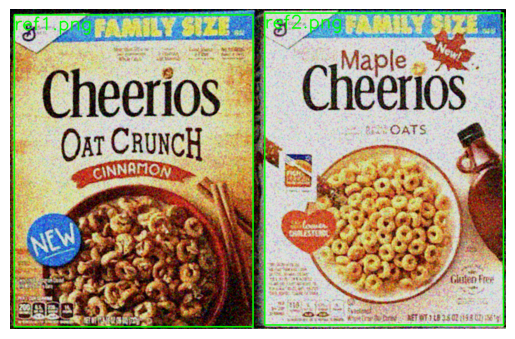

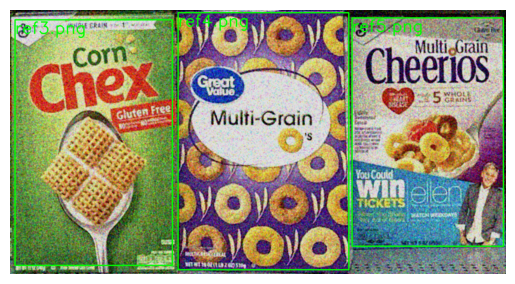

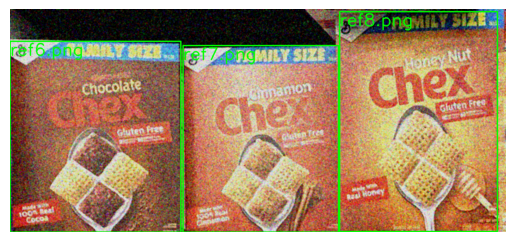

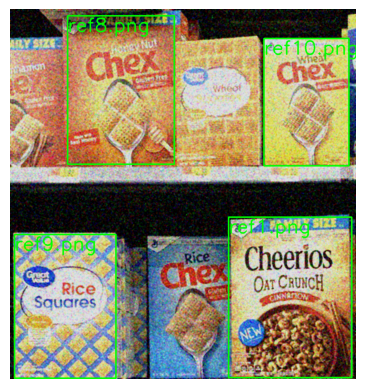

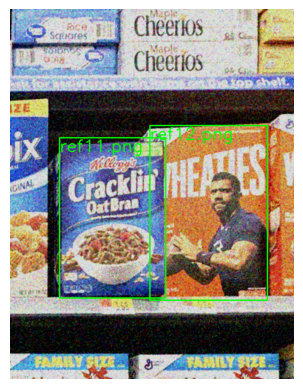

In [ ]:
# Define function to print outlined models over the scene
def plot_scene_with_models(scene_img, model_data):
    scene_with_outlines = scene_img.copy()  # Make a copy of the scene image to avoid modifying the original
    for model_label, result_data in model_data.items():
        # Extract bounding box coordinates
        top_left = result_data['position']
        width, height = result_data['dimension']
        bottom_right = (top_left[0] + width, top_left[1] + height)
        # Draw rectangle on the copied image with thicker line
        cv2.rectangle(scene_with_outlines, top_left, bottom_right, (0, 255, 0), 3)  # Draw a green rectangle with thickness 3
        cv2.putText(scene_with_outlines, model_label, (top_left[0], top_left[1] + 50), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 255, 0), 4)
    plt.imshow(scene_with_outlines)
    plt.axis('off')
    plt.show()
'''
# Print the list of models
print("Models:")

# Print the images of the models in a single row
plt.figure(figsize=(20, 4))  # Set figure size
for idx, (model_label, model_img) in enumerate(models_dict_A.items()):
    plt.subplot(1, len(models_dict_A), idx + 1)
    plt.imshow(model_img)
    plt.title(model_label)
    plt.axis('off')
plt.show()
'''
# Print the results and visualize
for scene_label, scene_results in results.items():
    # IMPORTANT: to visualize the models over the unfiltered scenes, substitute next line with: scene_img = scenes_dict_A[scene_label[:-4]]
    scene_img = filtered_scenes_dict_A[scene_label]  # Get the scene image
    instances_found = sum(1 for result_data in scene_results.values() if result_data['score'] > threshold)
    '''
    print(f"\nResults for Scene {scene_label} - {instances_found} instances found")
    for model_label, result_data in scene_results.items():
        if result_data['score'] > threshold:
            print(f"Model {model_label}: {{position:{result_data['position']}, dimensions in px (width, height):{result_data['dimension']}}}")
    '''
    plot_scene_with_models(scene_img, scene_results)




In [ ]:
for scene_label, scene_results in results.items():
    instances_found = sum(1 for result_data in scene_results.values() if result_data['score'] > threshold)
    print(f"\nResults for Scene {scene_label} - {instances_found} instances found:")

    for idx, (model_label, result_data) in enumerate(scene_results.items(), start=1):
        if result_data['score'] > threshold:
            position = result_data['position']
            width, height = result_data['dimension']
            print(f"  Product {model_label}:")
            print(f"    Instance: {{position: ({position[0]}, {position[1]}), width: {width}px, height: {height}px}}")


Results for Scene scene1.png_k5 - 2 instances found:
  Product ref1.png:
    Instance: {position: (14, 19), width: 797px, height: 1041px}
  Product ref2.png:
    Instance: {position: (850, 13), width: 797px, height: 1041px}

Results for Scene scene2.png_k5 - 3 instances found:
  Product ref3.png:
    Instance: {position: (18, 39), width: 576px, height: 897px}
  Product ref4.png:
    Instance: {position: (615, 13), width: 625px, height: 939px}
  Product ref5.png:
    Instance: {position: (1252, 32), width: 554px, height: 834px}

Results for Scene scene3.png_k5 - 3 instances found:
  Product ref6.png:
    Instance: {position: (0, 114), width: 605px, height: 676px}
  Product ref7.png:
    Instance: {position: (613, 129), width: 551px, height: 661px}
  Product ref8.png:
    Instance: {position: (1168, 9), width: 559px, height: 779px}

Results for Scene scene4.png_k5 - 4 instances found:
  Product ref1.png:
    Instance: {position: (692, 660), width: 390px, height: 509px}
  Product ref8.pn

## SIFT


After trying and obtaining good results with Template Matching, we want also to try another approach: using SIFT to detect keypoints and compute their descriptors, so that we can later match the keypoints in models and scenes and compute homographies.

### Median and Bilateral filters

We tried this time using two filters: a median and a bilateral filter.

In [ ]:
filtered_scenes_dict_A = {} #list of models images to be used as query

for scene in scenes_dict_A:
    img_t = cv2.imread("dataset/scenes/" + scene)
    img_rgb = cv2.cvtColor(img_t, cv2.COLOR_BGR2RGB)

    img_rgb = cv2.medianBlur(img_rgb, 5)
    img_rgb = cv2.bilateralFilter(img_rgb, 9, 125, 75)

    filtered_scenes_dict_A[f"{scene}"] = img_rgb #appending the image to the list

plt.figure(figsize = (15, 30))
i = 1
for label,img in filtered_scenes_dict_A.items():
  plt.subplot(7,2,i)
  plt.imshow(img)
  plt.title(label)
  i = i + 1
plt.show()

https://github.com/leonardoman9/cvimages/blob/main/filtered_scenes_sift.png

### Detection of keypoints and computing descriptors

Now, we invoke ```cv2``` functions to perform keypoints detection and descriptors computation.



In [ ]:
sift = cv2.SIFT_create()

sift_keypoints_scenes = {}
sift_descriptors_scenes = {}
sift_keypoints_models = {}
sift_descriptors_models = {}
start_time = time.time()
for scene_label, scene_img in filtered_scenes_dict_A.items():
  #Keypoints and descriptor of scene image
  kp_scene = sift.detect(scene_img)
  kp_scene, des_scene = sift.compute(scene_img, kp_scene)
  sift_keypoints_scenes[scene_label] = kp_scene
  sift_descriptors_scenes[scene_label] = des_scene


for model_label, model_img in models_dict_A.items():
  #Keypoints and descriptor of model image
  kp_model = sift.detect(model_img)
  kp_model, des_model = sift.compute(model_img, kp_model)
  sift_keypoints_models[model_label] = kp_model
  sift_descriptors_models[model_label] = des_model

print(f"Elapsed time: {time.time() - start_time} seconds.")


Elapsed time: 13.347614765167236 seconds.


Visualization of keypoints of scenes and models:

In [ ]:

# Function to visualize keypoints with larger size
def visualize_keypoints(image, keypoints):
    img_visualization = image.copy()
    for kp in keypoints:
        x, y = int(kp.pt[0]), int(kp.pt[1])
        size = int(kp.size)
        cv2.circle(img_visualization, (x, y), size, 2)
    return img_visualization

# Collect all images and titles into a single list
all_images = []
all_titles = []

# Visualize keypoints for scenes
for scene_label, kp_scene in sift_keypoints_scenes.items():
    scene_img = filtered_scenes_dict_A[scene_label]
    scene_img_with_keypoints = visualize_keypoints(scene_img, kp_scene)
    all_images.append(scene_img_with_keypoints)
    all_titles.append(f"Scene: {scene_label}")

# Visualize keypoints for models
for model_label, kp_model in sift_keypoints_models.items():
    model_img = models_dict_A[model_label]
    model_img_with_keypoints = visualize_keypoints(model_img, kp_model)
    all_images.append(model_img_with_keypoints)
    all_titles.append(f"Model: {model_label}")

# Determine layout: 3 images per row
cols = 3
rows = (len(all_images) + cols - 1) // cols  # Calculate rows needed

# Display all images in a single figure
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5))
axes = axes.ravel()

for i, (image, title) in enumerate(zip(all_images, all_titles)):
    axes[i].imshow(image)
    axes[i].set_title(title)
    axes[i].axis('off')

# Hide any unused axes
for i in range(len(all_images), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()


https://github.com/leonardoman9/cvimages/blob/main/sift_keypoints_descriptors.png

### Matching

The script below matches keypoint descriptors between multiple scene and model images using the FLANN-based matcher.

We used the FLANN (Fast Library for Approximate nearest Neighbors) algorithm with the KD-Tree method for efficient nearest neighbor search. `FLANN_INDEX_KDTREE = 1` assigns the value 1 to the variable `FLANN_INDEX_KDTREE`, which indicates the use of the KD-Tree algorithm for the nearest neighbor search, the dictionary `index_params` is created with two parameters: `algorithm` set to `FLANN_INDEX_KDTREE` and `trees` set to 5. This configures the FLANN matcher to use a KD-Tree with 5 trees. `search_params` determines how many trees in the KD-Tree will be checked during the matching process, which can affect the quality and speed of the matches found.

The line `flann = cv2.FlannBasedMatcher(index_params, search_params)` creates an instance of the FLANN-based matcher using the previously defined index and search parameters. This matcher will be used to find matches between keypoints in the scene and model images. The `flann.knnMatch(des_model, des_scene, k=2)` function call performs k-nearest neighbor matching for the current model descriptor against the scene descriptor, retrieving the two best matches (`k=2`). The results are stored in the `matches` dictionary using the `matches_key`.




In [ ]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=1000)

flann = cv2.FlannBasedMatcher(index_params, search_params)

start_time = time.time()
matches = {}

for scene_label, des_scene in sift_descriptors_scenes.items():
    for model_label, des_model in sift_descriptors_models.items():
        matches_key = (scene_label, model_label)
        matches[matches_key] = flann.knnMatch(des_model,des_scene, k=2)
print(f"\nElapsed time: {time.time() - start_time:.2f} seconds.")



Elapsed time: 122.46 seconds.


### Validation

In the validation phase, we initialize and instantiate two constants: `MIN_MATCH_COUNT` at 100, which defines the minimum number of good matches required for validation, and `LOWE_RATIO` at 0.7 for applying Lowe's ratio test.

The code then iterates over the items in the `matches` dictionary, where each key represents a scene-label/model-label pair and contains matched keypoints. For each pair, it uses a list comprehension to apply Lowe's ratio test, retaining matches where the distance of the best match is significantly less than the distance of the second-best match, thereby ensuring quality matches. These good matches are stored in the `good_matches` dictionary. Subsequently, it creates a `true_matches` dictionary that includes only those pairs from `good_matches` that have at least 100 good matches.

In [ ]:
good_matches = {}
MIN_MATCH_COUNT = 100
LOWE_RATIO = 0.7
start_time = time.time()
for (scene_label, model_label), match_points in matches.items():
    good_matches[(scene_label, model_label)] = [m for m, n in match_points if m.distance < LOWE_RATIO * n.distance]
true_matches = {key: val for key, val in good_matches.items() if len(val) >= MIN_MATCH_COUNT}


print(f"Elapsed time: {time.time() - start_time} seconds.")


Elapsed time: 0.06127786636352539 seconds.


### Visualization of results

In [ ]:
# Collect all match images and titles into lists
all_matches = []
all_titles = []

# Visualize and collect the matches
for (scene_label, model_label), good_match_points in true_matches.items():
    scene_img = filtered_scenes_dict_A[scene_label]
    model_img = models_dict_A[model_label]
    img_matches = cv2.drawMatches(
        model_img, sift_keypoints_models[model_label],
        scene_img, sift_keypoints_scenes[scene_label],
        good_match_points, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )
    all_matches.append(img_matches)
    all_titles.append(f"Scene: {scene_label} vs Model: {model_label}")

# Define grid layout: 3 images per row
cols = 3
rows = (len(all_matches) + cols - 1) // cols  # Calculate necessary rows

# Display all match images in a single figure
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5))
axes = axes.ravel()

for i, (img, title) in enumerate(zip(all_matches, all_titles)):
    axes[i].imshow(img)
    axes[i].set_title(title)
    axes[i].axis('off')

# Hide any unused subplot axes
for i in range(len(all_matches), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

https://github.com/leonardoman9/cvimages/blob/main/sift_matches.png

Now we sort the good match points by distance to identify the best match. The position, width and height of the detected model in the scene are determined. This information is stored in the `detected_instances` dictionary, ensuring that each scene can hold multiple detected models.

For each instance in the detected models, the script calculates the homography matrix to perform a perspective transformation, allowing the model to be overlaid onto the scene with a bounding box sorrounding it.

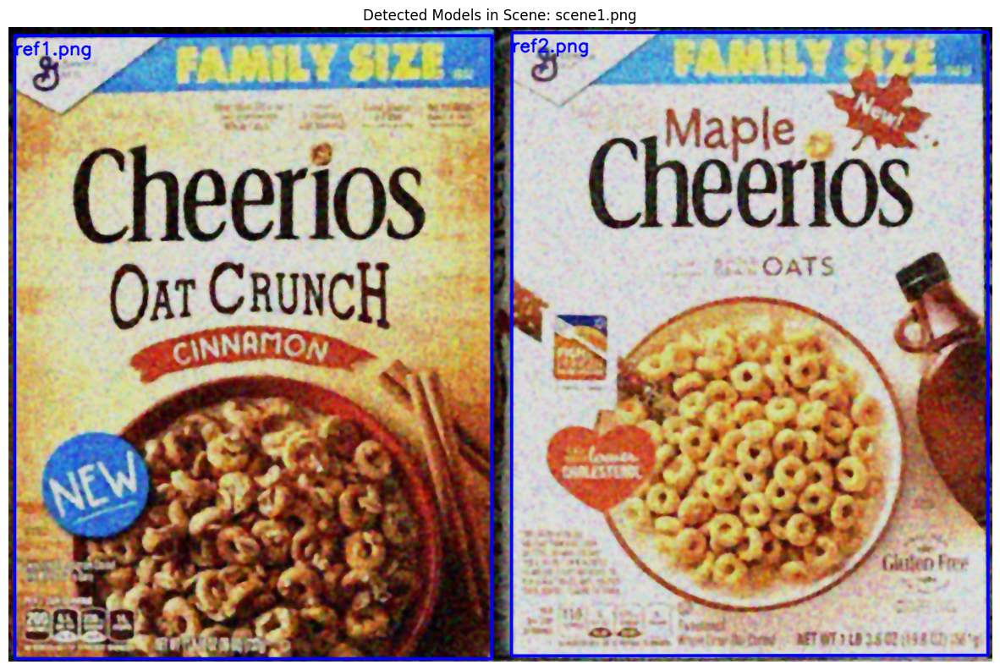

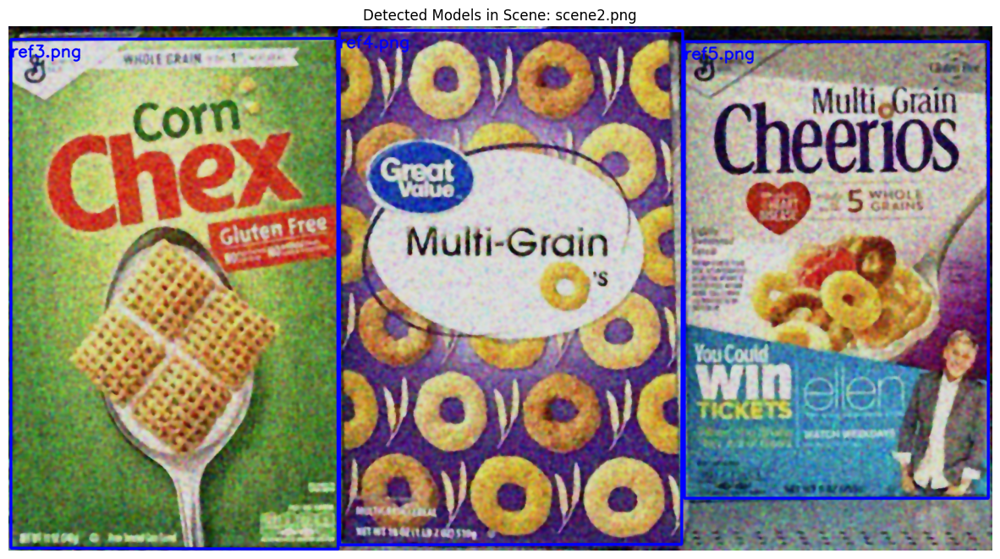

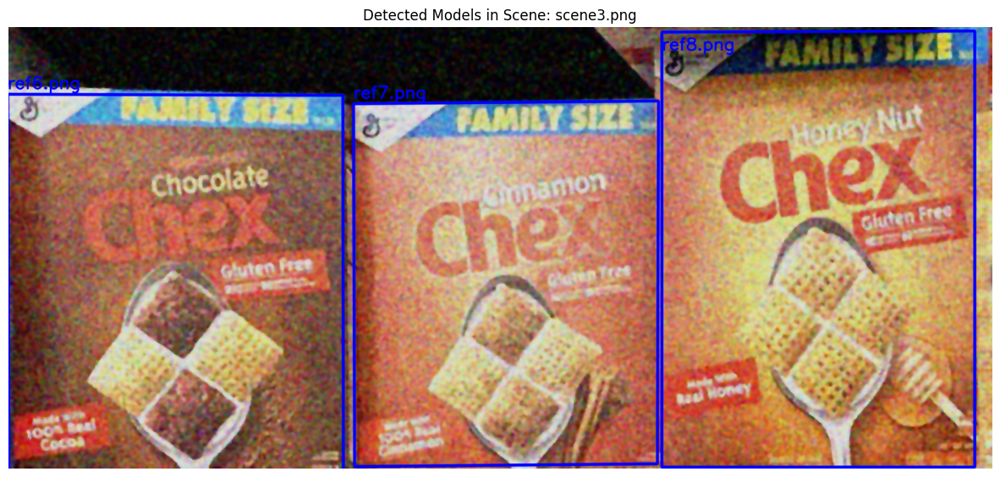

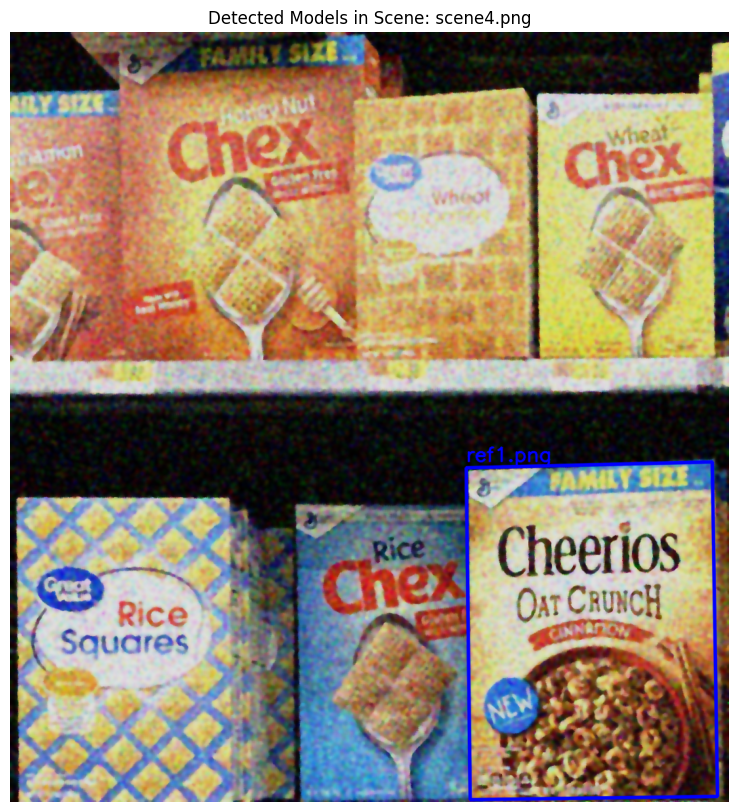

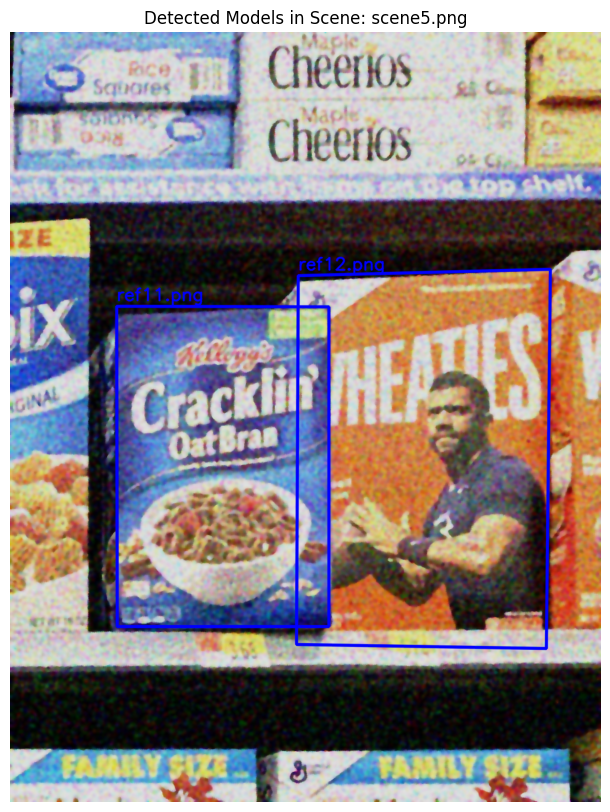

In [ ]:
detected_instances = {}

# Iterate over true_matches and visualize each model over its scene
for (scene_label, model_label), good_match_points in true_matches.items():
    # Sort matches by distance
    good_match_points = sorted(good_match_points, key=lambda x: x.distance)
    best_match = good_match_points[0]  # first match is the best
    # Calculate position and dimensions
    src_pt = sift_keypoints_models[model_label][best_match.queryIdx].pt
    dst_pt = sift_keypoints_scenes[scene_label][best_match.trainIdx].pt
    position = (int(dst_pt[0]), int(dst_pt[1]))
    model_width, model_height = models_dict_A[model_label].shape[:2]
    dimensions = (model_width, model_height)
    if scene_label not in detected_instances:
        detected_instances[scene_label] = []
    detected_instances[scene_label].append({
        "model": model_label,
        "position": position,
        "dimensions": dimensions
    })

for scene_label, instances in detected_instances.items():
    scene_img = filtered_scenes_dict_A[scene_label].copy()
    for instance in instances:
        model_label = instance['model']
        position = instance['position']
        model_img = models_dict_A[model_label]
        # Calculate homography and perspective transform
        src_pts = np.float32([sift_keypoints_models[model_label][m.queryIdx].pt for m in true_matches[(scene_label, model_label)]])
        dst_pts = np.float32([sift_keypoints_scenes[scene_label][m.trainIdx].pt for m in true_matches[(scene_label, model_label)]])
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        h_model, w_model = model_img.shape[:2]
        pts = np.float32([[0, 0], [0, h_model-1], [w_model-1, h_model-1], [w_model-1, 0]]).reshape(-1, 1, 2)
        dst = cv2.perspectiveTransform(pts, M)
        # Draw bounding box around the detected model in the scene
        scene_img_with_box = cv2.polylines(scene_img, [np.int32(dst)], True, (0, 0, 255), 3, cv2.LINE_AA)
        text_size, _ = cv2.getTextSize(model_label, cv2.FONT_HERSHEY_SIMPLEX, 1, 2)
        text_width = text_size[0]
        text_height = text_size[1]
        text_position = (int(dst[0][0][0]), int(dst[0][0][1]) - 10)
        # Adjust text position if it goes beyond image border
        if text_position[1] - text_height < 0:
            text_position = (text_position[0], text_position[1] + text_height + 20)

        cv2.putText(scene_img_with_box, model_label, text_position,
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2, cv2.LINE_AA)
    plt.figure(figsize=(15, 10))
    plt.imshow(scene_img_with_box)
    plt.title(f"Detected Models in Scene: {scene_label}")
    plt.axis('off')
    plt.show()

In [ ]:
'''

# Dictionary to store detected instances for each scene
detected_instances = {}
# Iterate over true_matches and store each detected instance
for (scene_label, model_label), good_match_points in true_matches.items():
    # Sort matches by distance
    good_match_points = sorted(good_match_points, key=lambda x: x.distance)
    best_match = good_match_points[0]  # first match is the best

    # Calculate position and dimensions
    src_pt = sift_keypoints_models[model_label][best_match.queryIdx].pt
    dst_pt = sift_keypoints_scenes[scene_label][best_match.trainIdx].pt
    position = (int(dst_pt[0]), int(dst_pt[1]))
    model_width, model_height = models_dict_A[model_label].shape[:2]
    dimensions = (model_width, model_height)
    # Store instance information in the dictionary
    if scene_label not in detected_instances:
        detected_instances[scene_label] = []
    detected_instances[scene_label].append({
        "model": model_label,
        "position": position,
        "dimensions": dimensions
    })
'''

# Print the results for each scene
for scene_label, instances in detected_instances.items():
    print(f"Results for Scene {scene_label} - {len(instances)} instances found:")
    for idx, instance in enumerate(instances, start=1):
        model_label = instance['model']
        position = instance['position']
        width, height = instance['dimensions']
        print(f"  Product {model_label}")
        print(f"    Instance: {{position: ({position[0]}, {position[1]}), width: {width}px, height: {height}px}}")


Results for Scene scene1.png - 2 instances found:
  Product ref1.png
    Instance: {position: (308, 702), width: 1108px, height: 848px}
  Product ref2.png
    Instance: {position: (372, 336), width: 1108px, height: 848px}
Results for Scene scene2.png - 3 instances found:
  Product ref3.png
    Instance: {position: (150, 217), width: 1402px, height: 900px}
  Product ref4.png
    Instance: {position: (1046, 871), width: 1342px, height: 894px}
  Product ref5.png
    Instance: {position: (1499, 231), width: 1192px, height: 792px}
Results for Scene scene3.png - 3 instances found:
  Product ref6.png
    Instance: {position: (417, 682), width: 1300px, height: 1164px}
  Product ref7.png
    Instance: {position: (805, 613), width: 870px, height: 726px}
  Product ref8.png
    Instance: {position: (1485, 331), width: 1026px, height: 736px}
Results for Scene scene4.png - 1 instances found:
  Product ref1.png
    Instance: {position: (861, 803), width: 1108px, height: 848px}
Results for Scene scene

## Conclusions

In our case, the Template Matching approach performed better than the SIFT method. We successfully identified all the correct models across the different scenes, though a few instances (particularly in scene4) presented challenges. Nevertheless, both approaches are effective, and some additional fine-tuning could likely enhance the results with SIFT as well.

# Task B - Multiple Instances Detection

##Denoising

We have started with the same procedure for the task A. So we have shown the histogram of every scene (for every channel) of the task B.

In [ ]:
####PARAMETES HISTOGRAM
alpha_r = alpha_g = alpha_b = 0.7
color_r, color_g, color_b = "red", "green", "blue"
y_lim_r = y_lim_g = y_lim_b = 450000
label_legend_r = "Pixels channel R"
label_legend_g = "Pixels channel G"
label_legend_b = "Pixels channel B"
label_x_r = label_x_g = label_x_b = "Pixels"
label_y_r = label_y_g = label_y_b = "Frequency"
num_bins = 256
pixel_range = [0, 256]

####PARAMETERS PLOT
rows = len(scenes_dict_B)
cols = 4
main_title = "Histogram of every channel of the scenes' task B"
style_main_title = (30,"red")
style_plot_title = (15,"black")

image_plot_list = []

for label,img in scenes_dict_B.items():

  #Compute the histogram of every scene
  title_r = "Histogram channel R of " + label
  hist_r = cv2.calcHist([img],[0],None,[num_bins],pixel_range)

  title_g = "Histogram channel G of " + label
  hist_g = cv2.calcHist([img],[1],None,[num_bins],pixel_range)

  title_b = "Histogram channel B of " + label
  hist_b = cv2.calcHist([img],[2],None,[num_bins],pixel_range)

  title_hist = "Histogram of " + label

  #Plot the scene
  image_plot_list.append(ImagePlot(label,img))

  #Plot the histogram
  hist_plot = HistRGBPlot(title_hist)
  hist_plot.setRedChannelHist(hist_r,title_r,alpha_r,color_r,y_lim_r,label_x_r, label_y_r, label_legend_r)
  hist_plot.setGreenChannelHist(hist_g,title_g,alpha_g,color_g,y_lim_g,label_x_g, label_y_g, label_legend_g)
  hist_plot.setBlueChannelHist(hist_b,title_b,alpha_b,color_b,y_lim_b,label_x_b, label_y_b, label_legend_b)
  hist_plot.setSplitHist(True)
  image_plot_list.append(hist_plot)

#Show
plot_data((30,6 * rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/d2d36b1427eae7595771c4e5d75320209e728820/deno1B.png

###Median filter

We have noticed that the impulse noise (aka Salt-and-pepper noise) is also present in these images so we have used the Median filter to reduce it.

There are 2 **large peaks** in each histogram. One of them is made up of a group of 0 pixels and the other one is made up of a group of 225 pixels. The amount of pixels in the 2 groups is high enough to obscure the distribution of the other pixels. All this facts can be an evidence that there is **impulse noise** (aka Salt-and-Pepper noise). One of the filter most effective for this type of noise is "Median filter".

Firstly, we have shown how the median filter is effective graphically against the noise using scene6.png.

In [ ]:
####PARAMETES HISTOGRAM
alpha_r = alpha_g = alpha_b = 0.7
color_r, color_g, color_b = "red", "green", "blue"
y_lim_r = y_lim_g = y_lim_b = 700000
label_legend_r = "Pixels channel R"
label_legend_g = "Pixels channel G"
label_legend_b = "Pixels channel B"
label_x_r = label_x_g = label_x_b = "Pixels"
label_y_r = label_y_g = label_y_b = "Frequency"
num_bins = 256
pixel_range = [0, 256]

####PARAMETERS MEDIAN FILTER
k_sizes = [3,5,7,9,11]

####PARAMETERS PLOT
rows = len(k_sizes)
cols = 3
style_main_title = (30,"red")
style_plot_title = (15,"black")

image_plot_list = []
label, img = list(scenes_dict_B.items())[0] #Choose the first scene
main_title = "Histogram of denoised " + label + " with Median filter for k=" + str(k_sizes)

for k_size in k_sizes:

  #Apply the median filter over the image
  title_median_img = label + " denoised with k=" + str(k_size)
  median_img = cv2.medianBlur(img, k_size)

  #Compute the histogram of all the channel
  title_r = "Histogram channel R of " + label + " denoised"
  hist_r = cv2.calcHist([median_img],[0],None,[num_bins],pixel_range)

  title_g = "Histogram channel G of " + label + " denoised"
  hist_g = cv2.calcHist([median_img],[1],None,[num_bins],pixel_range)

  title_b = "Histogram channel B of " + label + " denoised"
  hist_b = cv2.calcHist([median_img],[2],None,[num_bins],pixel_range)

  title_hist = "Histogram of " + label + " denoised with k=" + str(k_size)

  #Compose the list with all the images and histograms to plot
  image_plot_list.append(ImagePlot(label,img))
  image_plot_list.append(ImagePlot(title_median_img,median_img))

  hist_plot = HistRGBPlot(title_hist)
  hist_plot.setRedChannelHist(hist_r,title_r,alpha_r,color_r,y_lim_r,label_x_r, label_y_r, label_legend_r)
  hist_plot.setGreenChannelHist(hist_g,title_g,alpha_g,color_g,y_lim_g,label_x_g, label_y_g, label_legend_g)
  hist_plot.setBlueChannelHist(hist_b,title_b,alpha_b,color_b,y_lim_b,label_x_b, label_y_b, label_legend_b)
  image_plot_list.append(hist_plot)

plot_data((40,6*rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)


https://github.com/LorenzoSansone/ImageComputerVision/blob/f5acaaeeeec0ec9766d2486aad29da3bc500523c/median1b.png

The strategy is right because the image is improved and the **noise is reduced**. Unfortunatly this trend is not equal in every scene because the salt-and-pepper noise is not equal in every image so we can't delete totally the disturb from every scene. Moreover we can't use high values of k becuase the images start blurring and there are some scene where the details are fundamental (like scene12.png)

In [ ]:
####PARAMETERS FILTER
k_sizes = [3,5,7,9,11]

####PARAMETERS PLOT
cols = len(k_sizes) + 1 # num cols plot -> length = k_sizes + 1(img with noise)
rows = len(scenes_dict_B) #num rows plot
style_main_title = (30,"red")
style_plot_title = (15,"black")
main_title = "Denoised images with Median filters for every k=" + str(k_sizes)
image_plot_list = []

for label,img in scenes_dict_B.items():
  image_plot_list.append(ImagePlot(label,img))

  for k_size in k_sizes:
    title_median_img = label + " denoised with k=" + str(k_size)
    median_img = cv2.medianBlur(img, k_size)
    image_plot_list.append(ImagePlot(title_median_img,median_img))

plot_data((40,6*rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/db43681ea3c5ebe7dffc73d482640df34cd9ee0e/medain2b.png

As we have expected all the scenes get better but scene12.png or scene9.png loose fundamental details as soon as we apply the median filter so it is necessary keep the k low.

We cut out some regions (**homogeneous regions**) of the scenes in order to get another point of view of the effects' filters.

We have created two list:
* **scenes_zoom_dict_B**: it contains all the zoomed images that we have cut out from the scenes. There are 4 homogeneous region for every scene.
* **sample_scenes_zoom_dict_B**: it contains only one zoomed image for every scene. This dictionary is useful for simple analysis.

In [ ]:
prefix = "zoom_"
label1,img1 = list(scenes_dict_B.items())[0] #scene1
label2,img2 = list(scenes_dict_B.items())[1] #scene2
label3,img3 = list(scenes_dict_B.items())[2] #scene3
label4,img4 = list(scenes_dict_B.items())[3] #scene4
label5,img5 = list(scenes_dict_B.items())[4] #scene5
label6,img6 = list(scenes_dict_B.items())[5] #scene6
label7,img7 = list(scenes_dict_B.items())[6] #scene7

#Compute the homogeneous images from scene1.png
img_zoom1 = img1[280:380,250:350]
img_zoom2 = img1[900:1000,100:200]
img_zoom3 = img1[900:1000,800:900]
img_zoom4 = img1[280:380,1000:1100]

#Compute the homogeneous images from scene2.png
img_zoom5 = img2[620:720,100:200]
img_zoom6 = img2[510:610,730:830]
img_zoom7 = img2[510:610,970:1070]
img_zoom8 = img2[445:545,500:600]

#Compute the homogeneous images from scene3.png
img_zoom9 = img3[50:150,100:200]
img_zoom10 = img3[400:500,30:130]
img_zoom11 = img3[450:550,30:130]
img_zoom12 = img3[650:750,300:400]

#Compute the homogeneous images from scene4.png
img_zoom13 = img4[100:200,20:120]
img_zoom14 = img4[100:200,260:360]
img_zoom15 = img4[460:560,630:730]
img_zoom16 = img4[465:565,860:960]

#Compute the homogeneous images from scene5.png
img_zoom17 = img5[530:630,150:250]
img_zoom18 = img5[590:690,380:480]
img_zoom19 = img5[700:800,380:480]
img_zoom20 = img5[600:700,1200:1300]

#Compute the homogeneous images from scene6.png
img_zoom21 = img6[430:530,870:970]
img_zoom22 = img6[410:510,1080:1180]
img_zoom23 = img6[420:520,1260:1360]
img_zoom24 = img6[500:600,800:900]

#Compute the homogeneous images from scene7.png
img_zoom25 = img7[100:200,100:200]
img_zoom26 = img7[100:200,350:450]
img_zoom27 = img7[100:200,600:700]
img_zoom28 = img7[100:200,900:1000]


#dictionary with all samples
scenes_zoom_dict_B = {prefix + label1+"_1":img_zoom1,  prefix + label1+"_2":img_zoom2,  prefix + label1+"_3":img_zoom3,  prefix + label1 + "_4":img_zoom4,
                      prefix + label2+"_1":img_zoom5,  prefix + label2+"_2":img_zoom6,  prefix + label2+"_3":img_zoom7,  prefix + label2 + "_4":img_zoom8,
                      prefix + label3+"_1":img_zoom9,  prefix + label3+"_2":img_zoom10, prefix + label3+"_3":img_zoom11, prefix + label3 + "_4":img_zoom12,
                      prefix + label4+"_1":img_zoom13, prefix + label4+"_2":img_zoom14, prefix + label4+"_3":img_zoom15, prefix + label4 + "_4":img_zoom16,
                      prefix + label5+"_1":img_zoom17, prefix + label5+"_2":img_zoom18, prefix + label5+"_3":img_zoom19, prefix + label5 + "_4":img_zoom20,
                      prefix + label6+"_1":img_zoom21, prefix + label6+"_2":img_zoom22, prefix + label6+"_3":img_zoom23, prefix + label6 + "_4":img_zoom24,
                      prefix + label7+"_1":img_zoom25, prefix + label7+"_2":img_zoom26, prefix + label7+"_3":img_zoom27, prefix + label7 + "_4":img_zoom28}

#dictionary with one homogeneous image for every scene
sample_scenes_zoom_dict_B ={prefix + label1:img_zoom1, prefix + label2:img_zoom5, prefix + label3:img_zoom9, prefix + label4:img_zoom13, prefix + label5:img_zoom17, prefix + label6:img_zoom21, prefix + label7:img_zoom25}


We apply the same analysis, that we have computed for the scenes, to the zoomed images. We want to show the behaviour of the noise in a different scale (obviously with different values). So we have tried to apply the median filter over the homogeneous images.

In [ ]:
####PARAMETES HISTOGRAM
alpha_r = alpha_g = alpha_b = 0.7
color_r, color_g, color_b = "red", "green", "blue"
y_lim_r = y_lim_g = y_lim_b = 6000
label_legend_r = "Pixels channel R"
label_legend_g = "Pixels channel G"
label_legend_b = "Pixels channel B"
label_x_r = label_x_g = label_x_b = "Pixels"
label_y_r = label_y_g = label_y_b = "Frequency"
num_bins = 256
pixel_range = [0, 256]

####PARAMETERS FILTER
k_sizes = [3,5,7]

####PARAMETERS PLOT
rows = len(sample_scenes_zoom_dict_B)
cols = 6
main_title = "Histograms for homogeneous images with Median filter for k=" + str(k_sizes)
style_main_title = (30,"red")
style_plot_title = (15,"black")


image_plot_list = []


for label,img in sample_scenes_zoom_dict_B.items():
  for k_size in k_sizes:

    #Apply the median filter
    title_median_img = label + " denoised with k=" + str(k_size)
    median_img = cv2.medianBlur(img, k_size)

    #Compute the histogram for every channel
    title_r = "Histogram channel R of denoised " + label + " with k=" + str(k_size)
    hist_r = cv2.calcHist([median_img], [0], None, [num_bins], pixel_range)

    title_g = "Histogram channel G of denoised " + label + " with k=" + str(k_size)
    hist_g = cv2.calcHist([median_img], [1], None, [num_bins], pixel_range)

    title_b = "Histogram channel B of denoised " + label + " with k=" + str(k_size)
    hist_b = cv2.calcHist([median_img], [2], None, [num_bins], pixel_range)

    title_hist = "Histogram of denoised " + label + " with k=" + str(k_size)


    #Append all the images and histogram to image_plt_list
    image_plot_list.append(ImagePlot(title_median_img,median_img))

    hist_plot = HistRGBPlot(title_hist)
    hist_plot.setRedChannelHist(hist_r,title_r,alpha_r,color_r,y_lim_r,label_x_r, label_y_r, label_legend_r)
    hist_plot.setGreenChannelHist(hist_g,title_g,alpha_g,color_g,y_lim_g,label_x_g, label_y_g, label_legend_g)
    hist_plot.setBlueChannelHist(hist_b,title_b,alpha_b,color_b,y_lim_b,label_x_b, label_y_b, label_legend_b)
    image_plot_list.append(hist_plot)

plot_data((40,6*rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/e00f9f62cea1cf339fd0b9d5beb167eed39ec3a8/median3b.png


In some examples, we can observe how good is the result that we have got from the median filters. For example, on zoom_scene7.png and zoom_scene11.png the salt-and-pepper noise seems to be almost deleted. The other scenes get better but the noise is still strongly present. These results are only useful to show better the process of denoising.

Like in the task A, We have easily obeserved that the 2 large peaks are in corresponding of the **pixel 0** and the **pixel 225**.

In order to understand better the effect of Median filter we can try to calculate the histogram of every scene, get the value of the peaks (that correspond to the salt-and-pepper's peaks) and show how much the noise (so the peaks) is reduced when we increase the k of filter.

In [ ]:
####PARAMETES DIAGRAM
alpha_r = alpha_g = alpha_b = 0.7
color_r, color_g, color_b = "red", "green", "blue"
line_r_1, line_g_1, line_b_1 = "-", "-", "-"
line_r_2, line_g_2, line_b_2 = "--", "--", "--"
label_legend_r_1 = "225 pixel peak channel R"
label_legend_g_1 = "225 pixel peak channel G"
label_legend_b_1 = "225 pixel peak channel B"

label_legend_r_2 = "0 pixel peak channel R"
label_legend_g_2 = "0 pixel peak channel G"
label_legend_b_2 = "0 pixel peak channel B"
label_x = "k_size"
label_y = "Pixels"

####PARAMETERS HISTOGRAM
num_bins = 256
pixel_range = [0, 256]

####PARAMETERES FILTER
k_sizes = [1,3,5,7,9,11,13]

#PARAMETER PLOT
rows = len(scenes_dict_B)
cols = 3
main_title = "Diagrams of scenes about the trend of the peaks of salt-and-pepper noise respect to k=" + str(k_sizes)
style_main_title = (30,"red")
style_plot_title = (15,"black")

#The value of pixels where there are the peaks of the salt-and-pepper noise
pixel1 = 225
pixel2 = 0
image_plot_list = []

for label,img in scenes_dict_B.items():
  peak_hist_r_list_1 = []
  peak_hist_g_list_1 = []
  peak_hist_b_list_1 = []

  peak_hist_r_list_2 = []
  peak_hist_g_list_2 = []
  peak_hist_b_list_2 = []

  for k_size in k_sizes:
    median_img = cv2.medianBlur(img, k_size)
    hist_r = cv2.calcHist([median_img], [0], None, [num_bins], pixel_range)
    hist_g = cv2.calcHist([median_img], [1], None, [num_bins], pixel_range)
    hist_b = cv2.calcHist([median_img], [2], None, [num_bins], pixel_range)

    peak_hist_r_list_1.append(getValueHist(hist_r, pixel1))
    peak_hist_g_list_1.append(getValueHist(hist_g, pixel1))
    peak_hist_b_list_1.append(getValueHist(hist_b, pixel1))

    peak_hist_r_list_2.append(getValueHist(hist_r, pixel2))
    peak_hist_g_list_2.append(getValueHist(hist_g, pixel2))
    peak_hist_b_list_2.append(getValueHist(hist_b, pixel2))

  title_diagram = "Diagram of pixel peaks (salt-and-pepper noise) of " + label
  diag_img = DiagramPlot(title_diagram, label_x, label_y)
  diag_img.setDiagram(k_sizes, peak_hist_r_list_1, label_legend_r_1, alpha_r, color_r, line_r_1)
  diag_img.setDiagram(k_sizes, peak_hist_g_list_1, label_legend_g_1, alpha_g, color_g, line_g_1)
  diag_img.setDiagram(k_sizes, peak_hist_b_list_1, label_legend_b_1, alpha_b, color_b, line_b_1)

  diag_img.setDiagram(k_sizes, peak_hist_r_list_2, label_legend_r_2, alpha_r, color_r, line_r_2)
  diag_img.setDiagram(k_sizes, peak_hist_g_list_2, label_legend_g_2, alpha_g, color_g, line_g_2)
  diag_img.setDiagram(k_sizes, peak_hist_b_list_2, label_legend_b_2, alpha_b, color_b, line_b_2)

  image_plot_list.append(diag_img)

plot_data((40,6*rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)


https://github.com/LorenzoSansone/ImageComputerVision/blob/7471511e849e8ef73b53c4e1bb41a46831409218/median4b.png

We apply the same procedure to homogeneous images.

In [ ]:
####PARAMETES DIAGRAM
alpha_r = alpha_g = alpha_b = 0.7
color_r, color_g, color_b = "red", "green", "blue"
line_r_1, line_g_1, line_b_1 = "-", "-", "-"
line_r_2, line_g_2, line_b_2 = "--", "--", "--"
label_legend_r_1 = "225 pixel peak channel R"
label_legend_g_1 = "225 pixel peak channel G"
label_legend_b_1 = "225 pixel peak channel B"

label_legend_r_2 = "0 pixel peak channel R"
label_legend_g_2 = "0 pixel peak channel G"
label_legend_b_2 = "0 pixel peak channel B"
label_x = "k_size"
label_y = "Pixels"

####PARAMETERS HISTOGRAM
num_bins = 256
pixel_range = [0, 256]

####PARAMETERES FILTER
k_sizes = [1,3,5,7,9,11,13]

#PARAMETER PLOT
rows = len(sample_scenes_zoom_dict_B)
cols = 3
main_title = "Diagram of homogeneous scenes about the trend of the peaks of salt-and-pepper noise respect to k=" + str(k_sizes)
style_main_title = (30,"red")
style_plot_title = (15,"black")

#The value of pixels where there are the peaks of the salt-and-pepper noise
pixel1 = 225
pixel2 = 0
image_plot_list = []

for label,img in sample_scenes_zoom_dict_B.items():
  peak_hist_r_list_1 = []
  peak_hist_g_list_1 = []
  peak_hist_b_list_1 = []

  peak_hist_r_list_2 = []
  peak_hist_g_list_2 = []
  peak_hist_b_list_2 = []

  for k_size in k_sizes:
    median_img = cv2.medianBlur(img, k_size)
    hist_r = cv2.calcHist([median_img], [0], None, [num_bins], pixel_range)
    hist_g = cv2.calcHist([median_img], [1], None, [num_bins], pixel_range)
    hist_b = cv2.calcHist([median_img], [2], None, [num_bins], pixel_range)

    peak_hist_r_list_1.append(getValueHist(hist_r, pixel1))
    peak_hist_g_list_1.append(getValueHist(hist_g, pixel1))
    peak_hist_b_list_1.append(getValueHist(hist_b, pixel1))

    peak_hist_r_list_2.append(getValueHist(hist_r, pixel2))
    peak_hist_g_list_2.append(getValueHist(hist_g, pixel2))
    peak_hist_b_list_2.append(getValueHist(hist_b, pixel2))

  title_diagram = "Diagram of pixel peaks (salt-and-pepper noise) of " + label
  diag_img = DiagramPlot(title_diagram, label_x, label_y)
  diag_img.setDiagram(k_sizes, peak_hist_r_list_1, label_legend_r_1, alpha_r, color_r, line_r_1)
  diag_img.setDiagram(k_sizes, peak_hist_g_list_1, label_legend_g_1, alpha_g, color_g, line_g_1)
  diag_img.setDiagram(k_sizes, peak_hist_b_list_1, label_legend_b_1, alpha_b, color_b, line_b_1)

  diag_img.setDiagram(k_sizes, peak_hist_r_list_2, label_legend_r_2, alpha_r, color_r, line_r_2)
  diag_img.setDiagram(k_sizes, peak_hist_g_list_2, label_legend_g_2, alpha_g, color_g, line_g_2)
  diag_img.setDiagram(k_sizes, peak_hist_b_list_2, label_legend_b_2, alpha_b, color_b, line_b_2)

  image_plot_list.append(diag_img)

plot_data((40,6*rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)


https://github.com/LorenzoSansone/ImageComputerVision/blob/e3836c8dcb0c09bf424f7d8efb548ccbe212fd1b/median5b.png

From the plot of the diagram of the scene we can notice that when we apply a k greater than 7 the peaks of the noise doesn't decrease significantly. We could think that is enough k = 5 because the majority of the scene are improved and the peaks doesn't decrease importantly. Obviously, when we apply a k>=7 the image starts to blur a lot.

The k = 3 and  k = 5 **improve significantly** the quality of image. So, it reasonable to start with k = 3 or k = 5 for Median filter in order to reduce the noise and keep the details as much as possible.

The trend is similar on the plot of zoomed image but it is not very marked.

Of course we have to keep in mind that some scenes are "fragile" due to the fact that some scenes have some fundamental details very blurred also with low values of k (like scene12.png).

In conclusion, we start using k = 5 for the median filter because it is a good compromise between the amount of noise removed from the image and the amount of details that are kept on the image. If it will not be enough we will increase or decrease k to 3 or 7 but we will surely avoid to use k greater or equal than 9 because the noise isn't reduced significantly anymore and the images start to blur a lot.

Let's build dictionary with filtered image in order to continue the process of denoising. From now, we use mainly the denoised images with median filter.

In [ ]:
k_size = 5
label_filter = " (MedFilt k=" + str(k_size) +  ")"
median_scenes_dict_B = {}
median_scenes_zoom_dict_B = {}
median_sample_scenes_zoom_dict_B = {}

#Denoising for the scenes dictionary
for label, img in scenes_dict_B.items():
  median_img = cv2.medianBlur(img, k_size)
  median_scenes_dict_B.update({label + label_filter:median_img})

#Denoising for the homogeneous scenes dictionary
for label, img in scenes_zoom_dict_B.items():
  median_img = cv2.medianBlur(img, k_size)
  median_scenes_zoom_dict_B.update({label + label_filter:median_img})

#Denoising for the small homogeneous scenes dictionary
for label, img in sample_scenes_zoom_dict_B.items():
  median_img = cv2.medianBlur(img, k_size)
  median_sample_scenes_zoom_dict_B.update({label + label_filter:median_img})

###Gaussian filter

From the previous analysis we can notice a normal distribution of the pixels on some histogram (mainly from the homogeneous images). This fact can be a clue that is present guassian noise. We make a deep exploration to confirm the hypothesis.

Firstly, we can explore the histogram in a better way in order to catch the gaussian noise:
* plot the histogram with a restricted range of pixels in order to delete the peaks of the pixels that black out the other one.
* plot the gaussian distribution calculated by statistical analysis

With the scenes it isn't very marked the presence of gaussian noise. We apply the procedure to homogeneous images.

In [ ]:
####PARAMETES HISTOGRAM
alpha_r = alpha_g = alpha_b = 0.3
color_r, color_g, color_b = "red", "green", "blue"
y_lim_r = y_lim_g = y_lim_b = 700000
label_legend_r = "Channel R"
label_legend_g = "Channel G"
label_legend_b = "Channel B"
label_x_r = label_x_g = label_x_b = "Pixels"
label_y_r = label_y_g = label_y_b = "Frequency"
num_bins = 223
pixel_range = [1, 224]

####PARAMETERS GAUSSIAN APPROXIMATION
gauss_color_r, gauss_color_g, gauss_color_b = "red", "green", "blue"
gauss_alpha_r = gauss_alpha_g = gauss_alpha_b = 0.9
x_range_gauss = (0,224)
gauss_label_legend_r = "Gaussian distribution R"
gauss_label_legend_g = "Gaussian distribution G"
gauss_label_legend_b = "Gaussian distribution B"
gauss_linestyle_r = gauss_linestyle_g = gauss_linestyle_b = "--"

####PARAMETERS PLOT
rows = len(median_scenes_zoom_dict_B)*2
cols = 4
main_title = "Histograms " + str(pixel_range) + " of every zoomed scenes with gaussian distribution approximation"
style_main_title = (30,"red")
style_plot_title = (15,"black")

image_plot_list = []
data_gauss_zoom = []
for label,img in median_scenes_zoom_dict_B.items():
  img_r, img_g, img_b = cv2.split(img)

  #Compute the histogram for each channel
  title_r = "Histogram channel R of " + label
  hist_r = cv2.calcHist([img_r],[0],None,[num_bins],pixel_range)

  title_g = "Histogram channel G of " + label
  hist_g = cv2.calcHist([img_g],[0],None,[num_bins],pixel_range)

  title_b = "Histogram channel B of " + label
  hist_b = cv2.calcHist([img_b],[0],None,[num_bins],pixel_range)

  title_hist = "Histogram of " + label

  image_plot_list.append(ImagePlot(label,img))

  hist_plot = HistRGBPlot(title_hist)
  hist_plot.setRedChannelHist(hist_r,title_r,alpha_r,color_r,y_lim_r,label_x_r, label_y_r, label_legend_r)
  hist_plot.setGreenChannelHist(hist_g,title_g,alpha_g,color_g,y_lim_g,label_x_g, label_y_g, label_legend_g)
  hist_plot.setBlueChannelHist(hist_b,title_b,alpha_b,color_b,y_lim_b,label_x_b, label_y_b, label_legend_b)

  #Compute the gaussian distribution
  x_r, y_r, mean_r,stddev_r = calcGauss(img_r,x_range_gauss)
  x_g, y_g, mean_g,stddev_g = calcGauss(img_g,x_range_gauss)
  x_b, y_b, mean_b,stddev_b = calcGauss(img_b,x_range_gauss)
  data_gauss_zoom.append([label, mean_r, stddev_r, mean_g, stddev_g, mean_b, stddev_b])
  hist_plot.setRedChannelGauss(x_r, y_r, gauss_linestyle_r, gauss_alpha_r, gauss_color_r, gauss_label_legend_r)
  hist_plot.setGreenChannelGauss(x_g, y_g, gauss_linestyle_g, gauss_alpha_g, gauss_color_g, gauss_label_legend_g)
  hist_plot.setBlueChannelGauss(x_b, y_b, gauss_linestyle_b, gauss_alpha_b, gauss_color_b, gauss_label_legend_b)
  hist_plot.setGaussHist(True)
  image_plot_list.append(hist_plot)

plot_data((40,6 * rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/abd227eeaa40e80aee44896a615cf6c2ff41c64a/median6b.png

By examining the histogram of the images above we can see that the pixel values follow a normal distribution which is indicative of Gaussian noise.

We have computed the standard deviation and the mean of every gaussian distribution for every image in order to have a quantitative measure.

In [ ]:
from prettytable import PrettyTable

table_zoom = PrettyTable(["Name image", "mean red channel", "stddev red channel", "mean green channel", "stddev green channel", "mean blue channel", "stddev blue channel"])

#Compute mean and stddve of homogeneous images
for label_img, mean_r, stddev_r, mean_g, stddev_g, mean_b, stddev_b in data_gauss_zoom:
  table_zoom.add_row([label_img, round(mean_r,1), round(stddev_r,1), round(mean_g,1), round(stddev_g,1), round(mean_b,1), round(stddev_b,1)])

print(table_zoom)


The data from homogeneous images are more useful because the noise is more highlighted.

In order to reduce the gaussian noise we can try to apply the guassian filter but it is likely that this type of filter is **not enough** to reduce the noise. Moreover it will be **reduce heavily the details** and this could be a problem with the scene12.png (it is particular fragile due to the small details). To sum up, we have decided to use another type of filter to denoise the images.

###Bilateral filter

We have used the bilateral filter to accomplish denoising of gaussian-like noise. It should reduce the gaussina noise without blurring too much the edges.


We have applied the bilateral filter mainly to the homogeneous images because is more clear the effect of the filter over the noise.

In [ ]:
####PARAMETERS FILTER
dim_kernel = [i for i in range(6,21,6)]
sigma_params = [i for i in range(50,200,50)]
params = []
for d in dim_kernel:
  for sigma in sigma_params:
    params.append((d,sigma,sigma))

####PARAMETERS HISTOGRAM
alpha_r = alpha_g = alpha_b = 0.4
color_r, color_g, color_b = "red", "green", "blue"
y_lim_r = y_lim_g = y_lim_b = 700000
label_legend_r = "Channel R"
label_legend_g = "Channel G"
label_legend_b = "Channel B"
label_x_r = label_x_g = label_x_b = "Pixels"
label_y_r = label_y_g = label_y_b = "Frequency"
num_bins = 223
pixel_range = [1, 224]

####PARAMTER GAUSSIAN APPROXIMATION
gauss_color_r, gauss_color_g, gauss_color_b = "red", "green", "blue"
gauss_alpha_r = gauss_alpha_g = gauss_alpha_b = 0.9
x_range_gauss = (0,224)
gauss_label_legend_r = "Gaussian distribution R"
gauss_label_legend_g = "Gaussian distribution G"
gauss_label_legend_b = "Gaussian distribution B"
gauss_linestyle_r = gauss_linestyle_g = gauss_linestyle_b = "--"

####PARAMETERS PLOT
cols = 5
rows = len(median_sample_scenes_zoom_dict_B)*2 #num rows plot
main_title = "Denoised images with bilateral filters"
style_main_title = (30,"red")
style_plot_title = (15,"black")

image_plot_list = []
data_gauss = []

for label,img in median_sample_scenes_zoom_dict_B.items():
  img_r, img_g, img_b = cv2.split(img)
  title_r = "Histogram channel R of " + label
  hist_r = cv2.calcHist([img_r],[0],None,[num_bins],pixel_range)
  title_g = "Histogram channel G of " + label
  hist_g = cv2.calcHist([img_g],[0],None,[num_bins],pixel_range)
  title_b = "Histogram channel B of " + label
  hist_b = cv2.calcHist([img_b],[0],None,[num_bins],pixel_range)
  title_gauss_hist ="Original histogram of " + label

  hist_plot = HistRGBPlot(title_gauss_hist)
  hist_plot.setRedChannelHist(hist_r,title_r,alpha_r,color_r,y_lim_r,label_x_r, label_y_r, label_legend_r)
  hist_plot.setGreenChannelHist(hist_g,title_g,alpha_g,color_g,y_lim_g,label_x_g, label_y_g, label_legend_g)
  hist_plot.setBlueChannelHist(hist_b,title_b,alpha_b,color_b,y_lim_b,label_x_b, label_y_b, label_legend_b)
  image_plot_list.append(hist_plot)

  for d,sigma_c,sigma_s in params:
    img_bil = cv2.bilateralFilter(img, d, sigma_c, sigma_s)
    img_r, img_g, img_b = cv2.split(img_bil)

    title_r = "Histogram channel R of " + label
    hist_r = cv2.calcHist([img_r],[0],None,[num_bins],pixel_range)

    title_g = "Histogram channel G of " + label
    hist_g = cv2.calcHist([img_g],[0],None,[num_bins],pixel_range)

    title_b = "Histogram channel B of " + label
    hist_b = cv2.calcHist([img_b],[0],None,[num_bins],pixel_range)

    title_gauss_hist ="Histogram of " + label + "\n denoised with params=" + str((d,sigma_c,sigma_s))

    hist_plot = HistRGBPlot(title_gauss_hist)
    hist_plot.setRedChannelHist(hist_r,title_r,alpha_r,color_r,y_lim_r,label_x_r, label_y_r, label_legend_r)
    hist_plot.setGreenChannelHist(hist_g,title_g,alpha_g,color_g,y_lim_g,label_x_g, label_y_g, label_legend_g)
    hist_plot.setBlueChannelHist(hist_b,title_b,alpha_b,color_b,y_lim_b,label_x_b, label_y_b, label_legend_b)

    x_r, y_r, mean_r,stddev_r = calcGauss(img_r,x_range_gauss)
    x_g, y_g, mean_g,stddev_g = calcGauss(img_g,x_range_gauss)
    x_b, y_b, mean_b,stddev_b = calcGauss(img_b,x_range_gauss)
    hist_plot.setRedChannelGauss(x_r, y_r, gauss_linestyle_r, gauss_alpha_r, gauss_color_r, gauss_label_legend_r)
    hist_plot.setGreenChannelGauss(x_g, y_g, gauss_linestyle_g, gauss_alpha_g, gauss_color_g, gauss_label_legend_g)
    hist_plot.setBlueChannelGauss(x_b, y_b, gauss_linestyle_b, gauss_alpha_b, gauss_color_b, gauss_label_legend_b)
    hist_plot.setGaussHist(True)

    image_plot_list.append(hist_plot)
    data_gauss.append([label, mean_r, stddev_r, mean_g, stddev_g, mean_b, stddev_b])


plot_data((40,7*rows),(rows,cols),main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/44b6861d1f85d0da354cc2259fad938c22c49b0a/bilateral1b.png

We have shown also the trend of the standard deviation using the bilateral filter

In [ ]:
####PARAMETES DIAGRAM
alpha_r = alpha_g = alpha_b = 0.7
color_r, color_g, color_b = "red", "green", "blue"
line_r, line_g, line_b = "-", "-", "-"
label_legend_r = "stddev channel R"
label_legend_g = "stddev channel G"
label_legend_b = "stddev channel B"
label_x = "Parameter (d, sigma_c, sigma_s)"
label_y = "Stddev"

####PARAMTER GAUSSIAN APPROXIMATION
x_range_gauss = (0,224)

####PARAMETERS PLOT
rows = len(median_scenes_zoom_dict_B)
cols = 1
main_title = "Trend of stddev of every homogeneous scene denoised with bilateral filter"
style_main_title = (30,"red")
style_plot_title = (15,"black")

####PARAMETERS FILTER
dim_kernel = [i for i in range(6,21,3)]
sigma_params = [i for i in range(50,250,50)]

params = []
for d in dim_kernel:
  for sigma in sigma_params:
    params.append((d,sigma,sigma))
params_str = [str(i) for i in params]

image_plot_list = []
for label,img in median_scenes_zoom_dict_B.items():
  stddev_r_list = []
  stddev_g_list = []
  stddev_b_list = []

  for d,sigma_c,sigma_s in params:
    img_bil = cv2.bilateralFilter(img, d, sigma_c, sigma_s)
    img_r, img_g, img_b = cv2.split(img_bil)

    x_r, y_r, mean_r,stddev_r = calcGauss(img_r,x_range_gauss)
    x_g, y_g, mean_g,stddev_g = calcGauss(img_g,x_range_gauss)
    x_b, y_b, mean_b,stddev_b = calcGauss(img_b,x_range_gauss)
    stddev_r_list.append(stddev_r)
    stddev_g_list.append(stddev_g)
    stddev_b_list.append(stddev_b)

  title_diagram = "Diagram of " + label +  " about the trend of stddev"
  diag_img = DiagramPlot(title_diagram, label_x, label_y)
  diag_img.setDiagram(params_str, stddev_r_list, label_legend_r, alpha_r, color_r, line_r)
  diag_img.setDiagram(params_str, stddev_g_list, label_legend_g, alpha_g, color_g, line_g)
  diag_img.setDiagram(params_str, stddev_b_list, label_legend_b, alpha_b, color_b, line_b)

  image_plot_list.append(diag_img)
plot_data((40,6 * rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/d99b61e596c7bbde554f23639a3ad537626da12b/bilateral1B_1.png

The bilater filter decreases the noise but it doesn't blur like the gaussian filter. In order to find the right values we have considered:
* the right size of d should be between 6 and 15
* the values of sigma_c and sigma_s should be greater or equal than 100 because reduce a lot the gaussian noise but we have to keep them low due to the fact that the images would start blurring

###Non-local means filter

The non-local means filter is a non-linear filter edge preserving smoothing filter. All the previous filters look the neighbourhood, but this does not happen to non-local filter. It isn't LTE filter (and we can not apply convolution) because the weights change at every position. It can be useful to reduce the noise without blurring too much the details (above all the edges).

In [ ]:
####PARAMETERS FILTER
params = []
h_list = [i for i in range(10,11,1)]
templ_list = [i for i in range(5,11,2)]
search_list = [i for i in range(13,19,2)]
for h in h_list:
  for templ in templ_list:
    for search in search_list:
      params.append((h,templ,search))

####PARAMETERS HISTOGRAM
alpha_r = alpha_g = alpha_b = 0.4
color_r, color_g, color_b = "red", "green", "blue"
y_lim_r = y_lim_g = y_lim_b = 700000
label_legend_r = "Channel R"
label_legend_g = "Channel G"
label_legend_b = "Channel B"
label_x_r = label_x_g = label_x_b = "Pixels"
label_y_r = label_y_g = label_y_b = "Frequency"
num_bins = 223
pixel_range = [1, 224]

####PARAMTER GAUSSIAN APPROXIMATION
gauss_color_r, gauss_color_g, gauss_color_b = "red", "green", "blue"
gauss_alpha_r = gauss_alpha_g = gauss_alpha_b = 0.9
x_range_gauss = (0,224)
gauss_label_legend_r = "Gaussian distribution R"
gauss_label_legend_g = "Gaussian distribution G"
gauss_label_legend_b = "Gaussian distribution B"
gauss_linestyle_r = gauss_linestyle_g = gauss_linestyle_b = "--"

####PARAMETERS PLOT
cols = 5
rows = len(median_sample_scenes_zoom_dict_B)*2 #num rows plot
main_title = "Denoised images with non local means filters"
style_main_title = (30,"red")
style_plot_title = (15,"black")

image_plot_list = []
data_gauss = []

for label,img in median_sample_scenes_zoom_dict_B.items():
  img_r, img_g, img_b = cv2.split(img)
  title_r = "Histogram channel R of " + label
  hist_r = cv2.calcHist([img_r],[0],None,[num_bins],pixel_range)
  title_g = "Histogram channel G of " + label
  hist_g = cv2.calcHist([img_g],[0],None,[num_bins],pixel_range)
  title_b = "Histogram channel B of " + label
  hist_b = cv2.calcHist([img_b],[0],None,[num_bins],pixel_range)
  title_gauss_hist ="Original histogram of " + label

  hist_plot = HistRGBPlot(title_gauss_hist)
  hist_plot.setRedChannelHist(hist_r,title_r,alpha_r,color_r,y_lim_r,label_x_r, label_y_r, label_legend_r)
  hist_plot.setGreenChannelHist(hist_g,title_g,alpha_g,color_g,y_lim_g,label_x_g, label_y_g, label_legend_g)
  hist_plot.setBlueChannelHist(hist_b,title_b,alpha_b,color_b,y_lim_b,label_x_b, label_y_b, label_legend_b)
  image_plot_list.append(hist_plot)

  for h, templ, search in params:
    img_nlm = cv2.fastNlMeansDenoisingColored(img, None, h, h, templ, search)
    #print(np.shape(img_nlm))
    #plt.imshow(img_nlm)
    img_r, img_g, img_b = cv2.split(img_nlm)

    title_r = "Histogram channel R of " + label
    hist_r = cv2.calcHist([img_r],[0],None,[num_bins],pixel_range)

    title_g = "Histogram channel G of " + label
    hist_g = cv2.calcHist([img_g],[0],None,[num_bins],pixel_range)

    title_b = "Histogram channel B of " + label
    hist_b = cv2.calcHist([img_b],[0],None,[num_bins],pixel_range)

    title_gauss_hist ="Histogram of " + label + "\n denoised with params=" + str((h, templ, search))

    hist_plot = HistRGBPlot(title_gauss_hist)
    hist_plot.setRedChannelHist(hist_r,title_r,alpha_r,color_r,y_lim_r,label_x_r, label_y_r, label_legend_r)
    hist_plot.setGreenChannelHist(hist_g,title_g,alpha_g,color_g,y_lim_g,label_x_g, label_y_g, label_legend_g)
    hist_plot.setBlueChannelHist(hist_b,title_b,alpha_b,color_b,y_lim_b,label_x_b, label_y_b, label_legend_b)

    x_r, y_r, mean_r,stddev_r = calcGauss(img_r,x_range_gauss)
    x_g, y_g, mean_g,stddev_g = calcGauss(img_g,x_range_gauss)
    x_b, y_b, mean_b,stddev_b = calcGauss(img_b,x_range_gauss)
    hist_plot.setRedChannelGauss(x_r, y_r, gauss_linestyle_r, gauss_alpha_r, gauss_color_r, gauss_label_legend_r)
    hist_plot.setGreenChannelGauss(x_g, y_g, gauss_linestyle_g, gauss_alpha_g, gauss_color_g, gauss_label_legend_g)
    hist_plot.setBlueChannelGauss(x_b, y_b, gauss_linestyle_b, gauss_alpha_b, gauss_color_b, gauss_label_legend_b)
    hist_plot.setGaussHist(True)

    image_plot_list.append(hist_plot)
    data_gauss.append([label, mean_r, stddev_r, mean_g, stddev_g, mean_b, stddev_b])


plot_data((40,7*rows),(rows,cols),main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/ec0af4b8d22f593bc1ee0e69b7174e932b8eceb2/non-local-mean1b.png

The non-local means filter is able to reduce the noise

In [ ]:
####PARAMETES DIAGRAM
alpha_r = alpha_g = alpha_b = 0.7
color_r, color_g, color_b = "red", "green", "blue"
line_r, line_g, line_b = "-", "-", "-"
label_legend_r = "stddev channel R"
label_legend_g = "stddev channel G"
label_legend_b = "stddev channel B"
label_x = "Sigma"
label_y = "Stddev"

####PARAMTER GAUSSIAN APPROXIMATION
x_range_gauss = (0,224)

####PARAMETERS PLOT
rows = len(median_scenes_zoom_dict_B)
cols = 1
main_title = "Trend of stddev of every homogeneous scene denoised with non-local mean filter"
style_main_title = (30,"red")
style_plot_title = (15,"black")

####PARAMETERS FILTER
params = []
h_list = [i for i in range(10,11,1)]
templ_list = [i for i in range(5,19,2)]
search_list = [i for i in range(9,19,2)]
for h in h_list:
  for templ in templ_list:
    for search in search_list:
      params.append((h,templ,search))
params_str = [str(i) for i in params]

image_plot_list = []
for label,img in median_scenes_zoom_dict_B.items():
  stddev_r_list = []
  stddev_g_list = []
  stddev_b_list = []
  for h, templ, search in params:
    img_nlm = cv2.fastNlMeansDenoisingColored(img, None, h, h, templ, search)


    img_r, img_g, img_b = cv2.split(img_nlm)

    x_r, y_r, mean_r,stddev_r = calcGauss(img_r,x_range_gauss)
    x_g, y_g, mean_g,stddev_g = calcGauss(img_g,x_range_gauss)
    x_b, y_b, mean_b,stddev_b = calcGauss(img_b,x_range_gauss)
    stddev_r_list.append(stddev_r)
    stddev_g_list.append(stddev_g)
    stddev_b_list.append(stddev_b)

  title_diagram = "Diagram of " + label +  " about the trend of stddev"
  diag_img = DiagramPlot(title_diagram, label_x, label_y)
  diag_img.setDiagram(params_str, stddev_r_list, label_legend_r, alpha_r, color_r, line_r)
  diag_img.setDiagram(params_str, stddev_g_list, label_legend_g, alpha_g, color_g, line_g)
  diag_img.setDiagram(params_str, stddev_b_list, label_legend_b, alpha_b, color_b, line_b)

  image_plot_list.append(diag_img)
plot_data((40,6 * rows),(rows,cols), main_title, style_main_title, style_plot_title, image_plot_list)

https://github.com/LorenzoSansone/ImageComputerVision/blob/d99b61e596c7bbde554f23639a3ad537626da12b/nonlocal1B_1.png

The non-local means is able to decrease the noise. The effect of the filter is similar to the bilateral one. In order to make a preference between these two filters we have to consider also their effect on the results about the matching between scene and models. However, the most significant values are:
* the template window size value should be between 7 and 11
* the search window size value should be between 13 and 15

In general, we have to avoid to consider high values of the filter (last part of the diagrams) because they can blur the images significantly.

All the values that we have specified for the filters are just a guide to denoise correctly the scenes. In order to be sure of the effectiveness of the filters we have to experiment several combination with instance detection algorithm

## Filter images, compute keypoints and descriptors and visualize

## Set Parameters

First, we prepare the environment with the models and the scenes, and initialize data structures that will be used later.

In [ ]:
# prepare variables
refs = range(15,28)
train = range(6,13)
query_names = []
train_names = []
for i in refs:
    query_names.append(f'ref{i}.png')
for i in train:
  train_names.append(f'scene{i}.png')
print(f"Loaded models: {query_names}")
print(f"Loaded scenes: {train_names}")

sift = cv2.SIFT_create()
bf = cv2.BFMatcher()

# Initialize lists for keypoints and descriptors
query_keypoints = []
query_descriptors = []

train_keypoints = []
train_descriptors = []

train_imgs = []
query_imgs = []

train_imgs_bgr = []
query_imgs_bgr = []

# Dictionary to hold denoised scenes
denoised_scenes_dict_B = {}


Loaded models: ['ref15.png', 'ref16.png', 'ref17.png', 'ref18.png', 'ref19.png', 'ref20.png', 'ref21.png', 'ref22.png', 'ref23.png', 'ref24.png', 'ref25.png', 'ref26.png', 'ref27.png']
Loaded scenes: ['scene6.png', 'scene7.png', 'scene8.png', 'scene9.png', 'scene10.png', 'scene11.png', 'scene12.png']


In [ ]:
# PARAMETERS

K_MEDIAN = 5 # K size of median filters
#parameters for the non-local means filter
H_VALUE = 10
H_COLOR_VALUE = 15
TEMPLATE_WINDOW_SIZE = 13
SEARCH_WINDOW_SIZE = 23
#lower coefficient
LOWE_COEFFICIENT = 0.8
# other parameters for transform
MAX_COLOR_DISTANCE = 100
MIN_KP = 28
ACCUMULATOR_THRESHOLD = 10
CONFIDENCE_THRESHOLD = 0.13



## Filtering and Keypoints

We used the following filters:
- `cv2.medianBlur` (Median Filter). This filter is very useful to remove salt-and-pepper noise.
- `cv2.fastNlMeansDenoisingColored` (Non-local Means Filter)
 NLM is particularly effective against Gaussian noise and can provide better visual quality than simpler filters. It takes into account the global structure of the image, making it adept at maintaining details in textured areas. The NLM filter has parameters (like the search window size and the template window size) that can be tuned for specific denoising requirements, providing flexibility depending on the nature of the images being processed.

Then, as in previous exercise, we extract SIFT keypoints and descriptors.

In [ ]:
for train in train_names:
    train_path = f'dataset/scenes/{train}'
    t = cv2.imread(train_path)
    if t is None:
        print(f"Failed to read train image: {train_path}")
        continue

    # Apply denoising
    median_img = cv2.medianBlur(t, K_MEDIAN)
    #img_bil = cv2.bilateralFilter(median_img, d, sigma_c, sigma_s)
    img_bil = cv2.fastNlMeansDenoisingColored(median_img, None, H_VALUE, H_COLOR_VALUE, TEMPLATE_WINDOW_SIZE, SEARCH_WINDOW_SIZE)

    train_imgs_bgr.append(t)
    denoised_scenes_dict_B[train] = img_bil



In [ ]:
# Now extract keypoints and descriptors from the denoised images
for query in query_names:
    query_path = f'dataset/models/{query}'
    q = cv2.imread(query_path, 0)
    if q is None:
        print(f"Failed to read query image: {query_path}")
        continue

    query_imgs.append(q)
    query_imgs_bgr.append(cv2.imread(query_path))
    kp, des = sift.detectAndCompute(q, None)
    query_keypoints.append(kp)
    query_descriptors.append(des)

# Extract keypoints and descriptors from denoised train images
for train_name, denoised_img in denoised_scenes_dict_B.items():
    denoised_gray = cv2.cvtColor(denoised_img, cv2.COLOR_BGR2GRAY)
    kp, des = sift.detectAndCompute(denoised_gray, None)
    train_keypoints.append(kp)
    train_descriptors.append(des)
    train_imgs.append(denoised_img)


Now, let's visualize the original and denoised images side by side.

In [ ]:

# Collect all images and titles into lists
all_images = []
all_titles = []

# Define parameters for display title
parameters = {
    'ksize': K_MEDIAN,
    'h': H_VALUE,
    'h_color': H_COLOR_VALUE,
    'template_size': TEMPLATE_WINDOW_SIZE,
    'search_size': SEARCH_WINDOW_SIZE
}

# Collect each original and denoised image pair
for i in range(len(train_names)):
    original_img = train_imgs_bgr[i]
    denoised_img = denoised_scenes_dict_B[train_names[i]]

    # Convert to RGB for consistent display
    original_img_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    denoised_img_rgb = cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB)

    all_images.extend([original_img_rgb, denoised_img_rgb])
    all_titles.extend([f"Original: {train_names[i]}", f"Denoised: {train_names[i]}"])

# Set layout for the combined figure (2 images per row, one original and one denoised)
cols = 2
rows = (len(all_images) + cols - 1) // cols  # Calculate required rows

# Display all images in a single figure
fig, axes = plt.subplots(rows, cols, figsize=(10, rows * 2.5))
axes = axes.ravel()

# Populate the subplots with images and titles
for i, (img, title) in enumerate(zip(all_images, all_titles)):
    axes[i].imshow(img)
    axes[i].set_title(title)
    axes[i].axis('off')

# Hide any unused axes
for i in range(len(all_images), len(axes)):
    axes[i].axis('off')

# Add a main title with parameter details
plt.suptitle(f"k={parameters['ksize']}, h={parameters['h']}, hForColor={parameters['h_color']}, "
             f"templateSize={parameters['template_size']}, searchSize={parameters['search_size']}")
plt.tight_layout()
plt.show()


https://github.com/leonardoman9/cvimages/blob/main/1b_denoised_before_after.png

## Generalized Hough Transform

For this task, we chose to implement a Generalized Hough Transform approach. The Generalized Hough Transform (GHT) is a powerful extension of the traditional Hough Transform that enables the detection of arbitrary shapes in images, making it particularly useful for tasks like multiple instance detection. By leveraging a voting-based mechanism, GHT accumulates evidence for the presence of a specific shape or object within an image based on the relationships between keypoints. This approach allows for the detection of instances that may vary in scale, rotation, and perspective, which is essential in real-world scenarios where objects can appear in diverse orientations and sizes. Additionally, GHT incorporates geometric transformations to model these variations accurately, enhancing the robustness of the detection process.

To implement this, we still have to implement a few functions that will result useful a bit later. An overall explanation of the full algorithm is given before the last code snippet.

### Validation function definition

The `find_good_matches` function identifies reliable matches between descriptors of query and training images using Lowe's ratio test. It first finds two nearest matches for each descriptor in the training image, then evaluates them to select only the "good" matches.

In [ ]:

def find_good_matches(des_query, des_train, kp_query, kp_train):
    matches = bf.knnMatch(des_train, des_query, k=2)
    good_matches = []

    for m, n in matches:
        if m.distance < LOWE_COEFFICIENT * n.distance:
            good_matches.append(m)

    return good_matches


### Confidence function

The `calculate_confidence` function computes a confidence score based on the ratio of good matches to the total keypoints in a query image. It takes two parameters: `num_good_matches`, representing the successful keypoint matches, and `total_keypoints`, which is the total number of keypoints in the query image. The function returns the fraction of good matches, which is interpreted as a confidence score between 0 and 1.

In [ ]:
def calculate_confidence(num_good_matches, total_keypoints):
    return 0 if total_keypoints == 0 else num_good_matches / total_keypoints

### Find barycenter

Calculates the barycenter (centroid) of a set of keypoints.
 The function takes a list of keypoints as input, where each keypoint has a 'pt' attribute that contains its coordinates (x, y). It iterates through all the keypoints, sums their coordinates, and computes the average position, which represents the barycenter.

In [ ]:
def find_baricenter(keypoints):
    sum_of_coordinates = np.array([0,0])
    for i in keypoints:
        sum_of_coordinates = sum_of_coordinates + i.pt
    baricenter = [sum_of_coordinates[0]/len(keypoints),sum_of_coordinates[1]/len(keypoints)]
    return baricenter


### GHT (Generalized Hough Transform)

This function calculates the scale ratios, rotation angles, and the transformed coordinates for the matched keypoints based on the provided baricenter. For each good match, it computes the following:
* The scale ratio based on the sizes of the train and query keypoints.
* The rotation angle difference between the train and query keypoints.
* The transformed x and y coordinates of the keypoints using the calculated scaleand rotation.

In [ ]:
def GHT_transform(good_matches,baricenter):
    scale_ratios = []
    rotations = []
    x_center = []
    y_center = []
    for m in good_matches:
        query_center = baricenter
        train_kp = kp_train[m.queryIdx]
        query_kp = kp_query[m.trainIdx]
        query_vector = np.array(query_kp.pt)-np.array(query_center)
        scale_kp = train_kp.size / query_kp.size
        scale_ratios.append(scale_kp)
        rot_kp = train_kp.angle - query_kp.angle
        rotations.append(rot_kp)
        #train_vector_x = train_kp.pt[0] - scale_kp * (np.cos(rot_kp) * query_vector[0] - np.sin(rot_kp) * query_vector[1])
        train_vector_x = train_kp.pt[0] - scale_kp * query_vector[0]
        x_center.append(train_vector_x)
        #train_vector_y = train_kp.pt[1] - scale_kp * (np.sin(rot_kp) * query_vector[0] + np.cos(rot_kp) * query_vector[1])
        train_vector_y = train_kp.pt[1] - scale_kp * query_vector[1]
        y_center.append(train_vector_y)
    return scale_ratios, rotations, x_center, y_center

### Compute bin values

Computes bin sizes and counts based on the scale ratios of matched keypoints.This function generates histogram data from the provided scale ratios to determine an appropriate scale for binning. It calculates the average scale and uses it to define the sizes of the bins in both x and y directions, as well as the number of bins required to cover the dimensions of the training image.

In [ ]:
def compute_bin_values(template,scale_ratios,train):
    counts_scale, bins_scale, _ = plt.hist(scale_ratios, bins='auto')
    scale = np.mean([bins_scale[np.argmax(counts_scale)], bins_scale[np.argmax(counts_scale) + 1]])
    x_bin_size = scale * template.shape[1] / 4
    y_bin_size = scale * template.shape[0] / 4
    x_bins = int(np.ceil(train.shape[1] / x_bin_size)+2)
    y_bins = int(np.ceil(train.shape[0] / y_bin_size)+2)
    plt.clf()
    return x_bin_size, y_bin_size, x_bins, y_bins

### Compute votation

Computes the voting process for the detected matches and generates an accumulator mask. This function takes into account the good matches in a 2D accumulator based on their coordinates, calculated from the center points derived from the keypoint matches. It uses a dictionary to store the matches at each bin location and creates a mask that identifies local maxima, indicating regions with a high density of matches.

In [ ]:
def compute_votation(x_bins, y_bins,good_matches):
    accumulator_matches = {}
    accumulator_mask = np.zeros((x_bins, y_bins))
    for i,m in enumerate(good_matches):
        x = int(np.floor(x_center[i]/(x_bin_size)))
        y = int(np.floor(y_center[i]/(y_bin_size)))
        s = scale_ratios[i]
        r = rotations[i]
        accumulator_matches[(x,y)] = accumulator_matches.get((x,y), [])
        accumulator_matches[(x,y)].append(m)
        if x>0 and y>0 and x< x_bins and y<y_bins:
            accumulator_mask[x,y] += 1

    mask = sk.local_maxima(accumulator_mask)
    accumulator_mask[mask != 1]=0
    accumulator_mask[accumulator_mask<ACCUMULATOR_THRESHOLD]=0

    return accumulator_mask,accumulator_matches

### Compute destination boxes

The `compute_destination_boxes` function detects and calculates bounding boxes around matched areas in a training image, based on keypoints from template images. For each location in the accumulator matches, it checks if the point lies within valid boundaries and passes the mask threshold, then collects source and destination points for matched keypoints in the template and training images. If a sufficient number of keypoints is gathered, it calculates a homography matrix to transform the coordinates of the template's bounding box to the training image. This transformation creates destination boxes that highlight areas corresponding to the template in the training image, with each box stored in the `dst` list along with the keypoint count in `dst_kp`. The function returns both lists, enabling further analysis of detected regions and match quality.

In [ ]:
def compute_destination_boxes(accumulator_matches,accumulator_mask,kp_template,kp_train,query_img_bgr):
    dst = []
    dst_kp = []
    for i in accumulator_matches.keys():
        if i[0]>=0 and i[1]>=0 and i[1]<accumulator_mask.shape[1] and i[0]<accumulator_mask.shape[0]:
            if (accumulator_mask[i[0],i[1]]>0):

                src_pts = []
                dst_pts = []

                for m in accumulator_matches[i]:
                    src_pts.append(kp_template[m.trainIdx].pt)
                    dst_pts.append(kp_train[m.queryIdx].pt)

                if (len(src_pts)>MIN_KP):

                    M, _ = cv2.findHomography(np.float32(src_pts).reshape(-1,1,2),np.float32(dst_pts).reshape(-1,1,2),cv2.RANSAC,5.0)

                    h, w, d = query_img_bgr.shape
                    pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1,1,2)

                    dst.append(cv2.perspectiveTransform(pts, M).reshape(-1,2))
                    dst_kp.append(len(src_pts))

    return dst,dst_kp

### Color Consistency

Checks the color consistency between a query image and a cropped training image.This function computes the average color of the query image and the cropped training image, then calculates the Euclidean distance between the two average colors. It assesses whether the color distance falls within a predefined threshold, indicating that the two images are sufficiently color-consistent.

In [ ]:
def color_consistency(query_img_bgr, train_img_crop):
    query_avg_color = query_img_bgr.reshape(-1,3).mean(axis=0)
    train_avg_color = train_img_crop.reshape(-1,3).mean(axis=0)
    color_distance = np.sqrt(sum(v ** 2 for v in (query_avg_color-train_avg_color)))
    return color_distance < MAX_COLOR_DISTANCE

### Filter Destination Boxes on Color Consistency

Filters the destination boxes based on color consistency between a query image and the corresponding cropped training images. This function evaluates each destination box by extracting the corresponding region from the training image. It then checks the color consistency between the query image and the cropped region. If the color consistency condition is met, the destination box and its associated keypoints are considered valid and added to the results.

In [ ]:
def filter_destination_boxes(query_img_bgr,dst_boxes_,train_img_bgr,dst_kp):
    found_query_boxes = []
    found_query_kp = []

    for i,dst_box in enumerate(dst_boxes):

        height, width, _ = train_img_bgr.shape

        center = (sum((dst_box[:,0])/4),sum((dst_box[:,1])/4))

        x_min = int(min(dst_box[:,0])) # dst_box[:,0] is all x coordinates
        x_max = int(max(dst_box[:,0]))
        y_min = int(min(dst_box[:,1])) # dst_box[:,1] is all y coordinates
        y_max = int(max(dst_box[:,1]))

        train_img_crop = train_img_bgr[max(y_min,0):min(y_max,height),
                                       max(x_min,0):min(x_max,width)]

        if color_consistency(query_img_bgr, train_img_crop):
            found_query_boxes.append(dst_box)
            found_query_kp.append(dst_kp[i])

    return found_query_boxes, found_query_kp

### Filter Multiple Bounding Boxes

The `filter_multiple` function improves the results of detected bounding boxes by keeping only the most reliable ones for each query instance while filtering out any overlapping or redundant matches. It takes the detected bounding boxes and their corresponding keypoints as inputs.

The function first checks each bounding box, calculating its minimum and maximum coordinates and finding its center point. It then looks for overlaps with previously filtered boxes. If an overlap occurs and a new box has more keypoints than an existing one, the function replaces the older box with the new one.

In [ ]:
def filter_multiple(dst_boxes, kps):
    filtered_boxes = []
    filtered_kps = []
    query_boxes = {}
    instances_found = [0] * len(query_names)
    instance_details = {}

    for name, boxes in enumerate(dst_boxes):
        for i, box in enumerate(boxes):
            if len(box) != 0:
                box = np.array(box).reshape(-1, 2)
                x_min = int(min(box[:, 0]))
                x_max = int(max(box[:, 0]))
                y_min = int(min(box[:, 1]))
                y_max = int(max(box[:, 1]))
                center = (sum((box[:, 0]) / 4), sum((box[:, 1]) / 4))
                f = filtered_boxes.copy()
                put = True

                # Keep track of boxes to remove
                boxes_to_remove = []

                for j, found_box in enumerate(f):
                    found_box = np.array(found_box).reshape(-1, 2)
                    x_found_min = int(min(found_box[:, 0]))
                    x_found_max = int(max(found_box[:, 0]))
                    y_found_min = int(min(found_box[:, 1]))
                    y_found_max = int(max(found_box[:, 1]))
                    found_center = (sum((found_box[:, 0]) / 4), sum((found_box[:, 1]) / 4))

                    if (found_center[0] > x_min and found_center[0] < x_max
                            and found_center[1] > y_min and found_center[1] < y_max) \
                            or \
                            (center[0] > x_found_min and center[0] < x_found_max
                             and center[1] > y_found_min and center[1] < y_found_max):
                        # Check if index `i` is valid for `kps`
                        if i < len(kps) and kps[i] > filtered_kps[j]:
                            boxes_to_remove.append(j)
                            instances_found[i] -= 1
                        else:
                            put = False

                # Remove boxes outside the loop
                for idx in sorted(boxes_to_remove, reverse=True):
                    del filtered_boxes[idx]
                    del filtered_kps[idx]

                if put:
                    filtered_boxes.append(box)
                    # Check if index `i` is valid for `kps`
                    if i < len(kps):
                        filtered_kps.append(kps[i])
                    else:
                        filtered_kps.append(0)  # Default value if out of range

                    # Save details of each instance
                    width = x_max - x_min
                    height = y_max - y_min
                    query_name = query_names[name]
                    instance_details.setdefault(query_name, []).append({
                        "position": center,
                        "width": width,
                        "height": height
                    })
                    instances_found[name] += 1

    # Print formatted output
    for i, query_name in enumerate(query_names):
        instances = instances_found[i]
        if instances != 0:
            print(f"Product {query_name} : {instances} times - {instances} instance(s) found:")
            for j, details in enumerate(instance_details[query_name]):
                position = details["position"]
                width = details["width"]
                height = details["height"]
                print(f"  Instance {j + 1} {{position: {(int(position[0]), int(position[1]))}, width: {width}px, height: {height}px}}")

    return filtered_boxes, query_boxes, instances_found


## Main Loop

- **Initialize the loop:** For each training image, the algorithm starts by printing the current scene number and retrieving the corresponding keypoints and descriptors.

- **Prepare storage:** Create empty lists to store found query boxes, found keypoints, and destination boxes for later processing.

- **Convert image format:** Retrieve the denoised version of the training image and convert it to RGB format for visualization.

- **Iterate over query images:** For each query image:
  - Retrieve its keypoints and descriptors.
  - Identify good matches between the query and training keypoints using the `find_good_matches` function.

- **Calculate confidence:** Compute a confidence score based on the number of good matches relative to the total keypoints in the query image.

- **Check confidence threshold:** If the confidence score meets or exceeds a predefined threshold, proceed with further processing:
  - Perform a geometric transformation to find scale ratios and rotations using the matched keypoints.
  - Compute bin sizes and bin values for histogram voting.
  - Create an accumulator mask and gather matches using the `compute_votation` function.
  - Determine destination boxes and keypoints with the `compute_destination_boxes` function.
  - Filter the destination boxes based on the query image and store the results.

- **Filter multiple detections:** Use the `filter_multiple` function to consolidate and manage the detected bounding boxes and keypoints across all query images.

- **Draw bounding boxes:** For each found query box, draw the corresponding bounding box on the training image in green.

- **Visualize results.**


Processing scene 1/7
Product ref15.png : 3 times - 3 instance(s) found:
  Instance 1 {position: (187, 620), width: 345px, height: 914px}
  Instance 2 {position: (582, 620), width: 325px, height: 907px}
  Instance 3 {position: (941, 620), width: 342px, height: 912px}


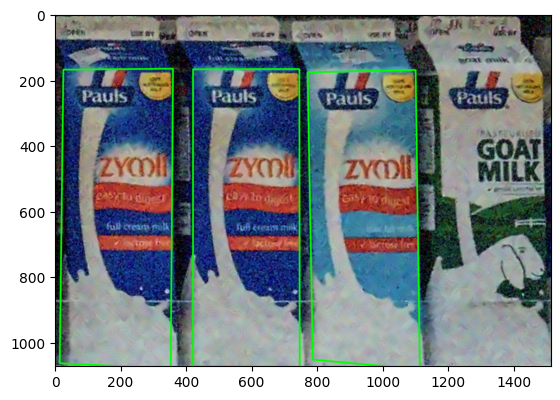

Processing scene 2/7
Product ref16.png : 2 times - 2 instance(s) found:
  Instance 1 {position: (794, 461), width: 217px, height: 601px}
  Instance 2 {position: (1030, 461), width: 229px, height: 602px}


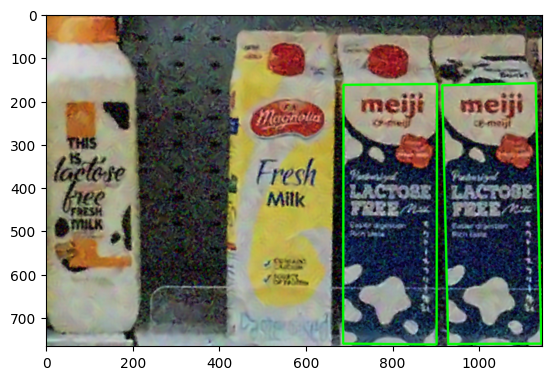

Processing scene 3/7
Product ref17.png : 3 times - 3 instance(s) found:
  Instance 1 {position: (648, 568), width: 327px, height: 854px}
  Instance 2 {position: (988, 576), width: 331px, height: 853px}
  Instance 3 {position: (1340, 575), width: 334px, height: 855px}


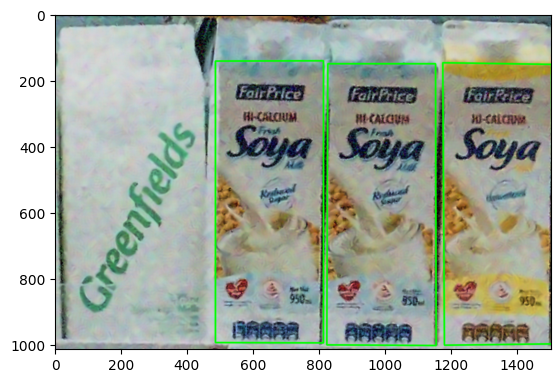

Processing scene 4/7
Product ref17.png : 2 times - 2 instance(s) found:
  Instance 1 {position: (620, 373), width: 228px, height: 559px}
  Instance 2 {position: (848, 374), width: 239px, height: 570px}


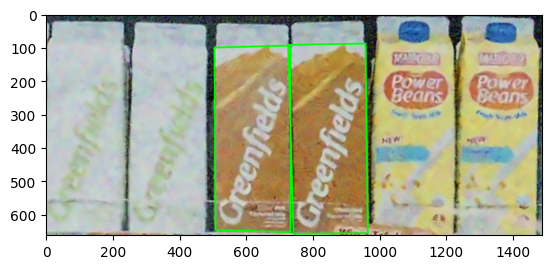

Processing scene 5/7
Product ref21.png : 3 times - 3 instance(s) found:
  Instance 1 {position: (708, 531), width: 244px, height: 700px}
  Instance 2 {position: (984, 537), width: 246px, height: 704px}
  Instance 3 {position: (1263, 539), width: 255px, height: 715px}
Product ref22.png : 1 times - 1 instance(s) found:
  Instance 1 {position: (1523, 522), width: 253px, height: 692px}


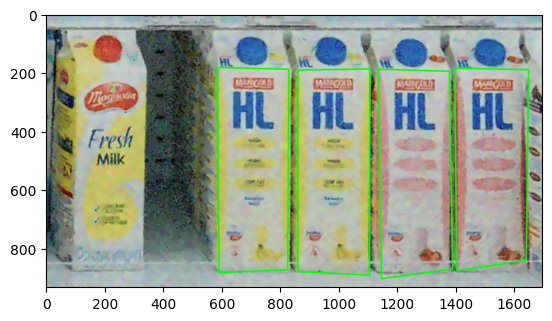

Processing scene 6/7
Product ref16.png : 2 times - 2 instance(s) found:
  Instance 1 {position: (165, 361), width: 183px, height: 483px}
  Instance 2 {position: (358, 363), width: 185px, height: 483px}
Product ref23.png : 2 times - 2 instance(s) found:
  Instance 1 {position: (555, 367), width: 186px, height: 487px}
  Instance 2 {position: (745, 399), width: 210px, height: 537px}
Product ref24.png : 2 times - 2 instance(s) found:
  Instance 1 {position: (1142, 371), width: 186px, height: 485px}
  Instance 2 {position: (1342, 373), width: 190px, height: 486px}


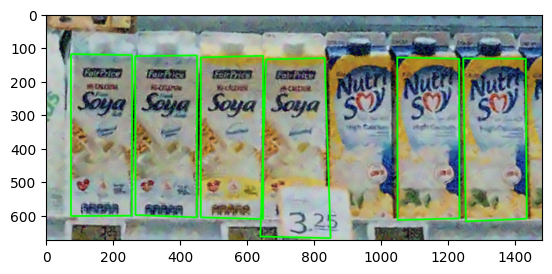

Processing scene 7/7
Product ref21.png : 2 times - 2 instance(s) found:
  Instance 1 {position: (135, 381), width: 246px, height: 593px}
  Instance 2 {position: (411, 404), width: 235px, height: 599px}


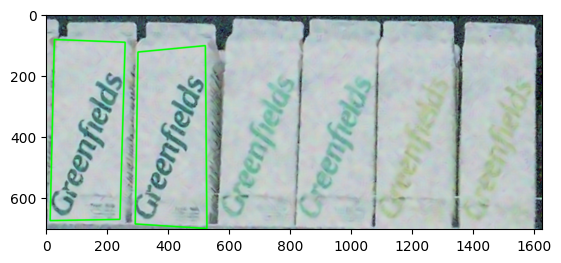

In [ ]:
# Main loop to process each training image
for i, train_img_bgr in enumerate(train_imgs_bgr):
    print(f"Processing scene {i + 1}/{len(train_imgs_bgr)}")
    kp_train, des_train = train_keypoints[i], train_descriptors[i]

    found_query_boxes = []
    found_query_kps = []
    dst_boxes = []

    # Store confidence scores for each query model
    confidence_scores = []

    train_img = denoised_scenes_dict_B[train_names[i]]
    train_img_rgb = cv2.cvtColor(train_img, cv2.COLOR_BGR2RGB)  # Convert to RGB for display

    for j, query_img_bgr in enumerate(query_imgs_bgr):
        kp_query, des_query = query_keypoints[j], query_descriptors[j]
        good_matches = find_good_matches(des_query, des_train, kp_query, kp_train)

        # Calculate confidence based on the number of good matches and total keypoints in the query
        confidence = calculate_confidence(len(good_matches), len(kp_query))  # Use query keypoints for confidence
        confidence_scores.append(confidence)

        # Only proceed if confidence exceeds the threshold
        if confidence >= CONFIDENCE_THRESHOLD:
            scale_ratios, rotations, x_center, y_center = GHT_transform(good_matches, find_baricenter(kp_query))
            x_bin_size, y_bin_size, x_bins, y_bins = compute_bin_values(query_img_bgr, scale_ratios, train_img_bgr)

            accumulator_mask, accumulator_matches = compute_votation(x_bins, y_bins, good_matches)
            dst_boxes, dst_kp = compute_destination_boxes(accumulator_matches, accumulator_mask, kp_query, kp_train, query_img_bgr)
            filtered_boxes, filtered_kp = filter_destination_boxes(query_img_bgr, dst_boxes, train_img_bgr, dst_kp)
            found_query_boxes.append(filtered_boxes)
            found_query_kps.append(filtered_kp)

    found_query_boxes, query_boxes, instances_found = filter_multiple(found_query_boxes, found_query_kps)

    for dst_box in found_query_boxes:
            train_img = cv2.polylines(train_img, [np.int32(dst_box)], True, (0,255,0), 3, cv2.LINE_AA)
    train_img_rgb = cv2.cvtColor(train_img, cv2.COLOR_BGR2RGB)

    plt.imshow(train_img_rgb)
    plt.show()


## Conclusions

The Generalized Hough Transform algorithm implemented above functions correctly, but its performance is far from optimal. There are instances of false positives, as well as models that should be detected but aren't. Additionally, some detected elements are misclassified as other objects.

This could be due to several factors: first of all, the images were **very** noisy, so the denoising task was difficult and no further improvements were made after choosing the parameter we ended up with. Even when we tried different types of filters, namely Gaussian and Bilateral ones, we could not achieve higher standards of image quality.

We also conducted extensive parameter searches to optimize the values for the algorithm's parameters, yet we could not identify any combinations that resulted in better results than those we ended up selecting.